<a href="https://colab.research.google.com/github/surimajain/QuantAnalytics/blob/main/Simulation_And_Data_Extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install QuantLib

In [ ]:
from pandas_datareader.data import Options
import QuantLib as ql
from dateutil.parser import parse
import datetime as dt
from datetime import datetime
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.colors import LogNorm
from functools import partial
from scipy import optimize
import numpy as np
from scipy.interpolate import griddata
import random
import pandas as pd
from scipy.stats import lognorm

In [ ]:
def get_all_attributes(df_stock,S,prices):  
  if isinstance(S, pd.Series) or S.ndim==1:
    prices['UNIT_PRICE']=S
  else:
    prices['UNIT_PRICE']=S[0][1:]  
  open=df_stock['OPEN'].iloc[0]#+30
  low=df_stock['LOW'].iloc[0]
  high=df_stock['HIGH'].iloc[0]
  bid=df_stock['BID'].iloc[0]
  mid=df_stock['MID'].iloc[0]
  ask=df_stock['ASK'].iloc[0]
  So=df_stock['CLOSE'].iloc[0]
  prices['DATA_SOURCE_ID']='INTERNAL'
  prices['PRICE_SOURCE']='INTERNAL'
  prices['IDENTIFIER_TYPE']='INHOUSE'
  prices['MARKET_IDENTIFIER_TYPE']=df_stock['MARKET_IDENTIFIER_TYPE'].iloc[0]
  prices['MARKET_IDENTIFIER']=df_stock['MARKET_IDENTIFIER'].iloc[0]
  prices['PRICE_QUOTE_METHOD']=df_stock['PRICE_QUOTE_METHOD'].iloc[0]
  prices['PRICING_METHOD']=df_stock['PRICING_METHOD'].iloc[0]
  prices['Close']=prices['UNIT_PRICE']
  
  prices['DOWNSTREAM_SYSTEM']='SS_DWDF'
  prices['PRICE_TYPE']='CLOSE'
  prices['INSTRUMENT_TYPE']=df_stock['INSTRUMENT_TYPE'].iloc[0]
  prices['INSTRUMENT_IDENTIFIER']=df_stock['INSTRUMENT_IDENTIFIER'].iloc[0]
  # prices['COMMENTS']=df_stock['SIGMA']==
  if df_stock['COMMENTS'].iloc[0]:
    prices['COMMENTS']= df_stock['COMMENTS'].iloc[0] 
  else :
    prices['COMMENTS']= 'Comments from'+prices['INSTRUMENT_TYPE'][0]
  prices['PRICE_CURRENCY']=df_stock['PRICE_CURRENCY'].iloc[0]
  prices['Open']=prices['UNIT_PRICE']+(open-So)
  prices['Low']=prices['UNIT_PRICE']+(low-So)
  prices['High']=prices['UNIT_PRICE']+(high-So) 
  prices['Bid']=prices['UNIT_PRICE']+(bid-So)  
  prices['Mid']=prices['UNIT_PRICE']+(mid-So)  
  prices['Ask']=prices['UNIT_PRICE']+(ask-So)  
  prices['PRICE_DATE_YYYYMMDD']=prices['PRICE_DATE_YYYYMMDD'].apply(lambda x: dt.datetime.strftime(x, '%Y%m%d'))
  return prices

In [ ]:
df=pd.DataFrame()

In [ ]:
delta=[10,25,50,75,90]
deltaSpread=random.sample(range(1,100),len(delta))
tenors=['ON','1W','2W','1M','2M','3M','6M','9M','1Y','18M','2Y','3Y','4Y','5Y','7Y','10Y','15Y','20Y','30Y']
tenorsIR=['ON','SN','TN','1W','2W','3W','1M','2M','3M','4M','5M','6M','7M','8M','9M','10M','11M','1Y']
a = np.array(tenors)
a=np.tile(a,(len(delta),1))
a=a.reshape(len(tenors)*len(delta))
spreads=np.random.lognormal(size=len(delta))
df['Tenors']=a
a = np.array(tenorsIR)
a=np.tile(a,(len(delta),1))
a=a.reshape(len(tenorsIR)*len(delta))
df['TenorsIR']=a
df['Delta']=np.repeat(delta,len(tenors))
df['Spread']=np.repeat(spreads,len(tenors))
df.loc[df['Delta'] < 50, 'Call/Put'] = 'CALL' 
df.loc[df['Delta'] > 50, 'Call/Put'] = 'PUT' 
df.loc[df['Delta'] == 50, 'Call/Put'] = 'ATM' 
df

,Tenors,Delta,Spread,Call/Put
0,ON,10,1.086134,CALL
1,1W,10,1.086134,CALL
2,2W,10,1.086134,CALL
3,1M,10,1.086134,CALL
4,2M,10,1.086134,CALL
...,...,...,...,...
90,7Y,90,0.182260,PUT
91,10Y,90,0.182260,PUT
92,15Y,90,0.182260,PUT
93,20Y,90,0.182260,PUT


Tenor to Days Converter

In [ ]:
def tenorToDays(k):
  if k=='ON':
    p=ql.Period('1D')
  elif k=='SN':
    p=ql.Period('2D')  
  elif k=='TN':
    p=ql.Period('3D') 
  else:   
    p=ql.Period(k)
  if p.units()==0 :
    days=p.length()
  elif p.units()==3:
    days=p.length()*365  
  elif p.units()==2:
    days=p.length()*30
  elif p.units()==1:
    days=p.length()*7         
  else: days=-1
  return days

keys = tenors
vals = [lambda keys: tenorToDays(keys)]
final_list = list(map(lambda x: tenorToDays(x), keys))



b = np.array(final_list)
b=np.tile(b,(len(delta),1))
b=b.reshape(len(tenors)*len(delta))

df['TenorDays']=b
df

,Tenors,Delta,Spread,Call/Put,TenorDays
0,ON,10,1.086134,CALL,1
1,1W,10,1.086134,CALL,7
2,2W,10,1.086134,CALL,14
3,1M,10,1.086134,CALL,30
4,2M,10,1.086134,CALL,60
...,...,...,...,...,...
90,7Y,90,0.182260,PUT,2555
91,10Y,90,0.182260,PUT,3650
92,15Y,90,0.182260,PUT,5475
93,20Y,90,0.182260,PUT,7300


Linear Interpolation

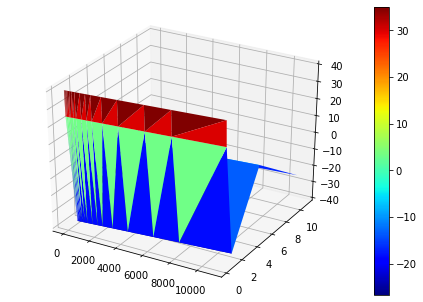

In [ ]:
# Linear interpolation in python

# Input section
def interpolate(x0,y0,x1,y1,xp):
  yp = y0 + ((y1-y0)/(x1-x0)) * (xp - x0)
  return yp

y0=df.TenorDays[0:1].values[0]
y1=df.TenorDays[df.shape[0]-1:].values[0]
x0=0
x1=1  
interpolated = list(map(lambda x: interpolate(y0,x0,y1,x1,x), final_list))
df['CLOSE']=np.tile(interpolated,5)+df['Spread']
# df.to_csv("/content/vol.csv")

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = Axes3D(fig)

surf=ax.plot_trisurf(df.TenorDays, df.CLOSE, df.Delta-df.Delta.mean(), cmap=cm.jet)
fig.colorbar(surf)

plt.show()

In [303]:
def simulate_gbm(df_seed,assettype,forward,start_dt,end_dt):
  pred_start_dt=start_dt
  pred_end_dt=end_dt
  df_list=list()
  i=0
  try:
    for stock in df_seed['TICKER'].unique():
      
      prices=pd.DataFrame(columns=['IDENTIFIER_TYPE','INSTRUMENT_IDENTIFIER','INSTRUMENT_TYPE','PRICE_CURRENCY','PRICE_DATE_YYYYMMDD','UNIT_PRICE','PRICE_TYPE','MARKET_IDENTIFIER_TYPE','MARKET_IDENTIFIER','ADDITIONAL_PRICE_QUALIFIER','DATA_SOURCE_ID','PRICE_SOURCE','DOWNSTREAM_SYSTEM','PRICING_METHOD','PRICE_QUOTE_METHOD','COMMENTS','Open','Ask','Bid','Close','High','Low','Mid','Last'])
      df_stock=df_seed[df_seed['TICKER']==stock]
      print(stock,df_stock['CLOSE'].iloc[0])
      if forward==False:
        mu=df_stock['MU'].iloc[0]*(-1)
      else:
        mu=df_stock['MU'].iloc[0]
      So=df_stock['CLOSE'].iloc[0]   
      print(So)   
      sigma=df_stock['SIGMA'].iloc[0]
      # pred_end_dt=df_stock['PRC_TMS'].iloc[0]
      n_of_wkdays = pd.date_range(start = pd.to_datetime(pred_start_dt, 
                      format = "%Y-%m-%d") + pd.Timedelta('1 days'), 
                      end = pd.to_datetime(pred_end_dt, 
                      format = "%Y-%m-%d")).to_series().map(lambda x: 
                      1 if x.isoweekday() in range(1,6) else 1).sum()
      T = n_of_wkdays # days  # User input -> follows from pred_end_date 
      t = np.arange(1, int(T) + 1)
      b=np.random.normal(0, 1, int(T))
      W = b.cumsum()
      drift = (mu - 0.5 * sigma**2) * t
      diffusion = sigma * W
      
      # # Making the predictions
      S = np.array([float(So) * np.exp(drift + diffusion)])
      if forward==False:
        S = np.fliplr(S)
      S = np.hstack((np.array([[So]]), S))  # add So to the beginning series     
      
      
      prices['PRICE_DATE_YYYYMMDD']=np.array((pd.date_range(pred_start_dt, periods=T, freq  ='D').tolist()))
      fig=plt.gcf().set_size_inches(20, 10)
      
      # plt.Figure(figsize=(40,10))
      plt.title("Daily Volatility of {}:{} ".format(stock,str(sigma)))
      plt.plot(prices['PRICE_DATE_YYYYMMDD'], S[0][1:])  
      # plt.plot(prices['PRICE_DATE_YYYYMMDD'], prices['Open'])  

      plt.ylabel('Stock Prices, €')
      plt.xlabel('Prediction Days')
      plt.show()
      fig=plt.gcf().set_size_inches(20, 10)     
            
      df_list.append(get_all_attributes(df_stock,S,prices))
      i=i+1
  except Exception as e:
    print(e)    
  if(len(df_list)>0):
    merged = pd.concat(df_list)
  else:
    merged = pd.DataFrame(df_list)
  merged = merged.iloc[: , :]
  merged.drop(merged[pd.to_datetime(merged['PRICE_DATE_YYYYMMDD']).dt.weekday>5].index, inplace = True)
  merged[1:].to_csv("/content/"+assettype+".csv",index=False)


In [306]:
def simulate_irdep(df_seed,assettype,forward,start_dt,end_dt,spread,tenor,merged):
  pred_start_dt=start_dt
  pred_end_dt=end_dt
  df_list=list()
  i=0
  try:
    for stock in df_seed['TICKER'].unique():
      prices=pd.DataFrame(columns=['IDENTIFIER_TYPE','INSTRUMENT_IDENTIFIER','INSTRUMENT_TYPE','PRICE_CURRENCY','PRICE_DATE_YYYYMMDD','UNIT_PRICE','PRICE_TYPE','MARKET_IDENTIFIER_TYPE','MARKET_IDENTIFIER','ADDITIONAL_PRICE_QUALIFIER','DATA_SOURCE_ID','PRICE_SOURCE','DOWNSTREAM_SYSTEM','PRICING_METHOD','PRICE_QUOTE_METHOD','COMMENTS','Open','Ask','Bid','Close','High','Low','Mid','Last'])
      df_stock=df_seed[df_seed['TICKER']==stock]

      So=df_stock['CLOSE'].iloc[0]  
        
      sigma=df_stock['SIGMA'].iloc[0]
      T = pd.date_range(start = pd.to_datetime(pred_start_dt, 
                      format = "%Y-%m-%d") + pd.Timedelta('1 days'), 
                      end = pd.to_datetime(pred_end_dt, 
                      format = "%Y-%m-%d"), freq  ='B').to_series().map(lambda x: 
                      1 if x.isoweekday() in range(1,6) else 1).sum()
      x_axis = np.arange(-1*So, So, (So*2)/T)  
      S = np.array([abs(np.random.normal(So, sigma, int(T)))+0.05]) 
      S = np.hstack((np.array([[So]]), S)) 
      df_stock['INSTRUMENT_IDENTIFIER']=stock[:-2] +tenor
      print(df_stock['INSTRUMENT_IDENTIFIER'])
      prices['PRICE_DATE_YYYYMMDD']=np.array((pd.date_range(pred_start_dt, periods=T, freq  ='B').tolist()))
      fig=plt.gcf().set_size_inches(20, 10)
      
      # plt.Figure(figsize=(40,10))
      plt.title("Daily Volatility of {}:{} ".format(stock[:-2] +tenor,str(sigma)))
      plt.plot(prices['PRICE_DATE_YYYYMMDD'], S[0][1:])  
      # plt.plot(prices['PRICE_DATE_YYYYMMDD'], prices['Open'])  

      plt.ylabel('Stock Prices, €')
      plt.xlabel('Prediction Days')
      plt.show()
      # plt.savefig(pdf)
      fig=plt.gcf().set_size_inches(20, 10)     
            
      df_list.append(get_all_attributes(df_stock,S,prices))
      i=i+1
  except Exception as e:
    print(e)    
  # if(len(df_list)>0):
  return df_list
  # else:
  #   merged = pd.DataFrame(df_list)
  

In [ ]:
def simulate_spot_multiply_constant(df_seed,assettype,forward,start_dt,end_dt,a):
  df_list=list()
  pred_start_dt=start_dt
  pred_end_dt=end_dt
  df_spot=pd.read_csv("/content/FXSPOT.csv")
  if df_spot.shape[0]==0:
    return
  for stock in df_seed['TICKER'].unique():
    spot_instr="FXSPOT_"+stock.split("_",1)[1]#FXFIX_AUD_CAD
    print(spot_instr)
    prices=pd.DataFrame(columns=['IDENTIFIER_TYPE','INSTRUMENT_IDENTIFIER','INSTRUMENT_TYPE','PRICE_CURRENCY','PRICE_DATE_YYYYMMDD','UNIT_PRICE','PRICE_TYPE','MARKET_IDENTIFIER_TYPE','MARKET_IDENTIFIER','ADDITIONAL_PRICE_QUALIFIER','DATA_SOURCE_ID','PRICE_SOURCE','DOWNSTREAM_SYSTEM','PRICING_METHOD','PRICE_QUOTE_METHOD','COMMENTS','Open','Ask','Bid','Close','High','Low','Mid','Last'])
    df_stock=df_seed[df_seed['TICKER']==stock]
    n_of_wkdays = pd.date_range(start = pd.to_datetime(pred_start_dt, 
                    format = "%Y-%m-%d") + pd.Timedelta('1 days'), 
                    end = pd.to_datetime(pred_end_dt, 
                    format = "%Y-%m-%d")).to_series().map(lambda x: 
                    1 if x.isoweekday() in range(1,6) else 1).sum()
    T = n_of_wkdays # days  # User input -> follows from pred_end_date  
    t = np.arange(1, int(T) + 1)
    
    S=np.array(df_spot[df_spot['INSTRUMENT_IDENTIFIER']==spot_instr]['Close'])*a

    prices['PRICE_DATE_YYYYMMDD']=np.array(pd.to_datetime(df_spot[df_spot['INSTRUMENT_IDENTIFIER']==spot_instr]['PRICE_DATE_YYYYMMDD'],format='%Y%m%d').tolist())
    fig=plt.gcf().set_size_inches(20, 10)
    
    # plt.Figure(figsize=(40,10))
    plt.title("Daily Volatility of {} ".format(stock))
    plt.plot(prices['PRICE_DATE_YYYYMMDD'], S)  
    # plt.plot(prices['PRICE_DATE_YYYYMMDD'], prices['Open'])  

    plt.ylabel('Stock Prices, €')
    plt.xlabel('Prediction Days')
    plt.show()
    fig=plt.gcf().set_size_inches(20, 10)     
    print(S.shape)      
    df_list.append(get_all_attributes(df_stock,S,prices))
    
  if(len(df_list)>0):
    merged = pd.concat(df_list)
  else:
    merged = pd.DataFrame(df_list)
  merged = merged.iloc[: , :]
  merged.drop(merged[pd.to_datetime(merged['PRICE_DATE_YYYYMMDD']).dt.weekday>5].index, inplace = True)
  merged.drop(merged[pd.to_datetime(merged['PRICE_DATE_YYYYMMDD']).dt.weekday==0].index, inplace = True)

  # merged['OFFSET']=pd.to_datetime(merged['PRICE_DATE_YYYYMMDD']).dt.weekday
  merged.to_csv("/content/"+assettype+".csv",index=False)

In [ ]:
def simulate_lognormal(df_seed,assettype,forward,start_dt,end_dt):
  pred_start_dt=start_dt
  pred_end_dt=end_dt
  df_list=list()
  i=0
  try:
    for stock in df_seed['TICKER'].unique():
      
      prices=pd.DataFrame(columns=['IDENTIFIER_TYPE','INSTRUMENT_IDENTIFIER','INSTRUMENT_TYPE','PRICE_CURRENCY','PRICE_DATE_YYYYMMDD','UNIT_PRICE','PRICE_TYPE','MARKET_IDENTIFIER_TYPE','MARKET_IDENTIFIER','ADDITIONAL_PRICE_QUALIFIER','DATA_SOURCE_ID','PRICE_SOURCE','DOWNSTREAM_SYSTEM','PRICING_METHOD','PRICE_QUOTE_METHOD','COMMENTS','Open','Ask','Bid','Close','High','Low','Mid','Last'])
      df_stock=df_seed[df_seed['TICKER']==stock]
      So=df_stock['CLOSE'].iloc[0]  
      mu, var, skew, kurt = lognorm.stats(So, moments='mvsk')

      if forward==False:
        mu=df_stock['MU'].iloc[0]*(-1)
      else:
        mu=df_stock['MU'].iloc[0]
      print(So)   

      n_of_wkdays = pd.date_range(start = pd.to_datetime(pred_start_dt, 
                      format = "%m/%d/%Y") + pd.Timedelta('1 days'), 
                      end = pd.to_datetime(pred_end_dt, 
                      format = "%m/%d/%Y")).to_series().map(lambda x: 
                      1 if x.isoweekday() in range(1,6) else 1).sum()
      T = n_of_wkdays # days  # User input -> follows from pred_end_date 
      t = np.arange(1, int(T) + 1)

      x = np.linspace(lognorm.ppf(0.01, So),lognorm.ppf(0.99, So), T)

      S=np.array([lognorm.cdf(x, So)])*So
      S = np.fliplr(S)
      S = np.hstack((np.array([[So]]), S))  # add So to the beginning series     
      
      
      prices['PRICE_DATE_YYYYMMDD']=np.array((pd.date_range(pred_start_dt, periods=T, freq  ='D').tolist()))
      fig=plt.gcf().set_size_inches(20, 10)
      
      # plt.Figure(figsize=(40,10))
      # plt.title("Daily Volatility of {}:{} ".format(stock,str(sigma)))
      plt.plot(prices['PRICE_DATE_YYYYMMDD'], S[0][1:])  
      # plt.plot(prices['PRICE_DATE_YYYYMMDD'], prices['Open'])  

      plt.ylabel('Stock Prices, €')
      plt.xlabel('Prediction Days')
      plt.show()
      fig=plt.gcf().set_size_inches(20, 10)     
            
      df_list.append(get_all_attributes(df_stock,S,prices))
      i=i+1
  except Exception as e:
    print(e)    
  if(len(df_list)>0):
    merged = pd.concat(df_list)
  else:
    merged = pd.DataFrame(df_list)
  merged = merged.iloc[: , :]
  merged.drop(merged[pd.to_datetime(merged['PRICE_DATE_YYYYMMDD']).dt.weekday>5].index, inplace = True)
  merged[1:].to_csv("/content/"+assettype+".csv",index=False)


IRDEPRT
           TICKER    PRC_TMS  ... DATA_SOURCE_ID  PRICE_SOURCE
0  IRDEPRT_EUR_ON 2019-11-30  ...       INTERNAL      INTERNAL
1  IRDEPRT_CHF_ON 2019-11-30  ...       INTERNAL      INTERNAL
2  IRDEPRT_GBP_ON 2019-11-30  ...       INTERNAL      INTERNAL
3  IRDEPRT_JPY_ON 2019-11-30  ...       INTERNAL      INTERNAL
4  IRDEPRT_USD_ON 2019-11-30  ...       INTERNAL      INTERNAL

[5 rows x 26 columns]
0    IRDEPRT_EUR_ON
Name: INSTRUMENT_IDENTIFIER, dtype: object


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


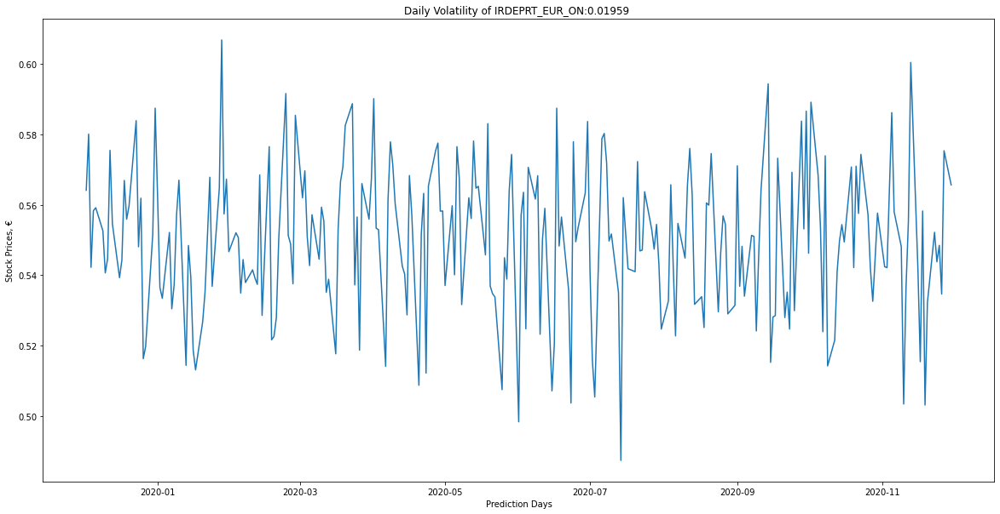

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_ON
Name: INSTRUMENT_IDENTIFIER, dtype: object


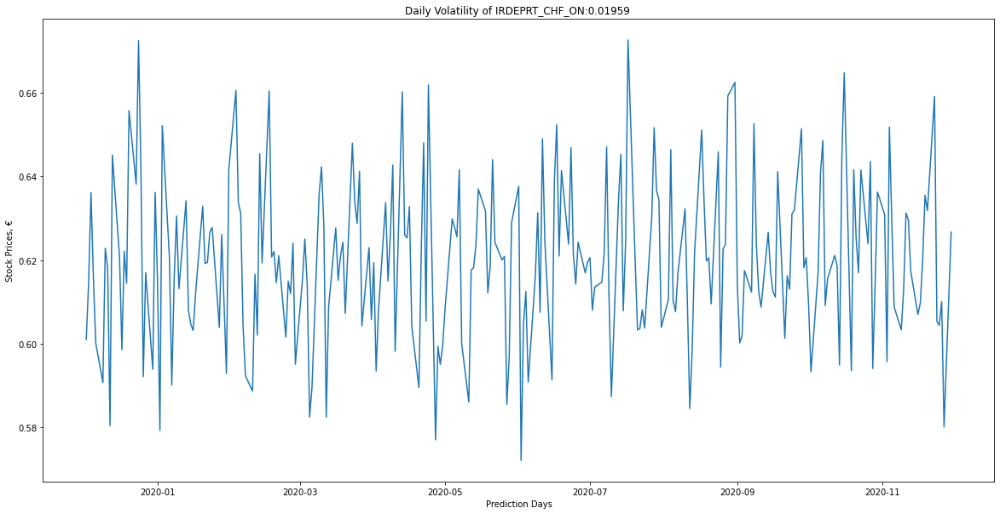

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_ON
Name: INSTRUMENT_IDENTIFIER, dtype: object


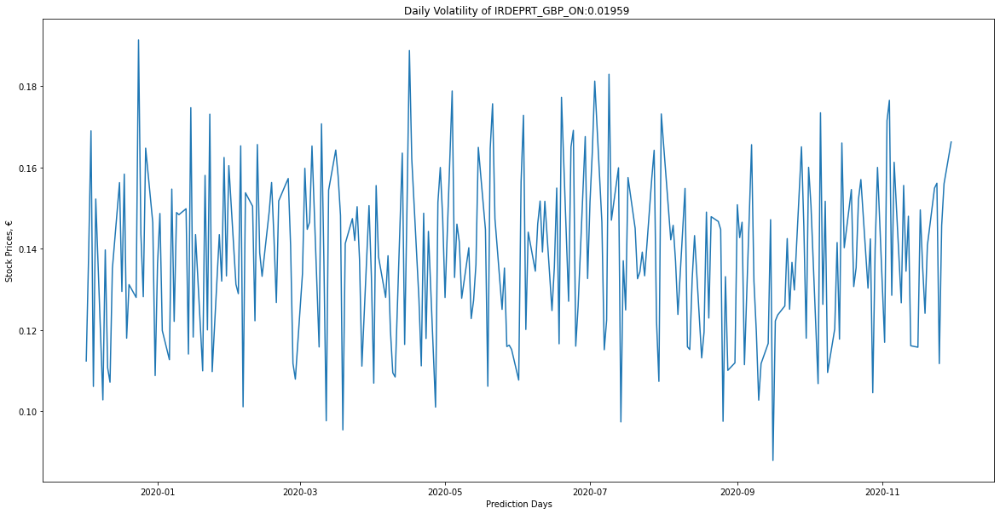

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_ON
Name: INSTRUMENT_IDENTIFIER, dtype: object


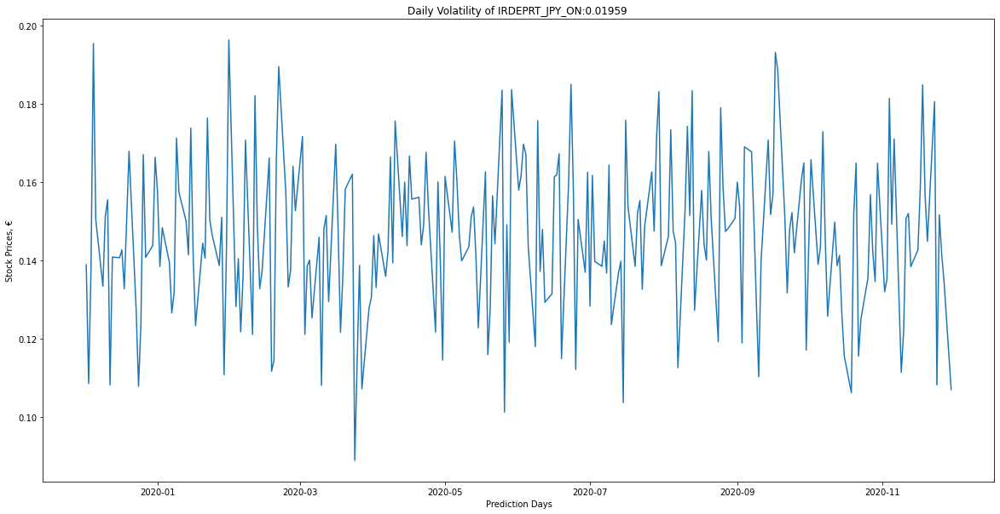

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_ON
Name: INSTRUMENT_IDENTIFIER, dtype: object


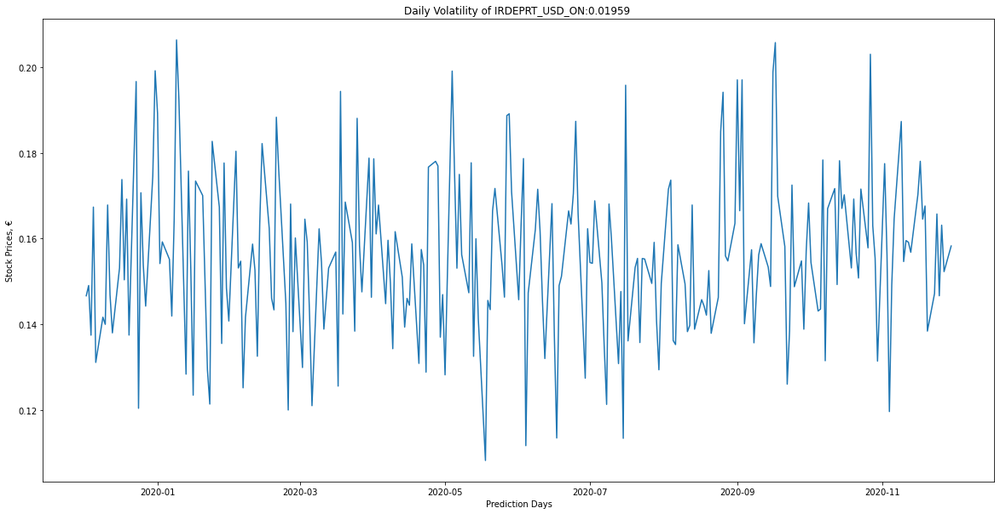

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_SN
Name: INSTRUMENT_IDENTIFIER, dtype: object


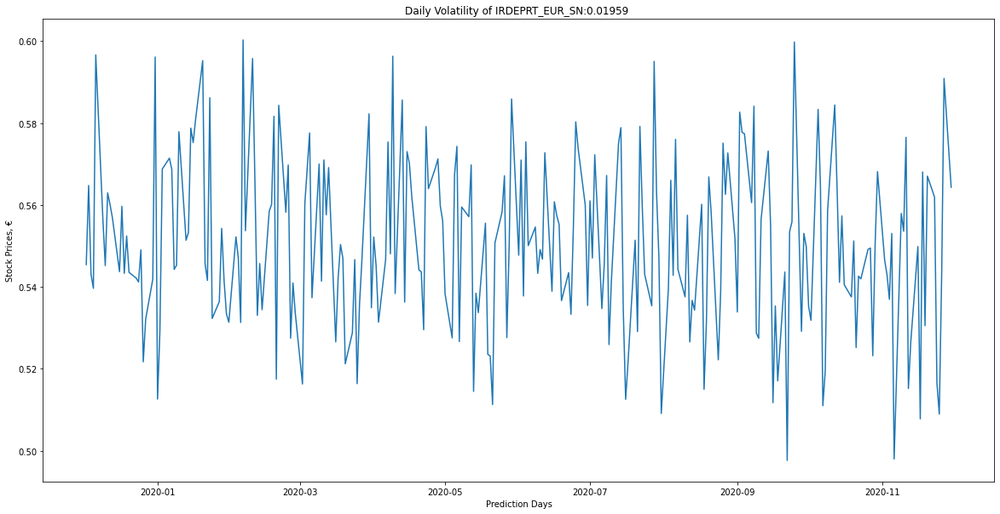

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_SN
Name: INSTRUMENT_IDENTIFIER, dtype: object


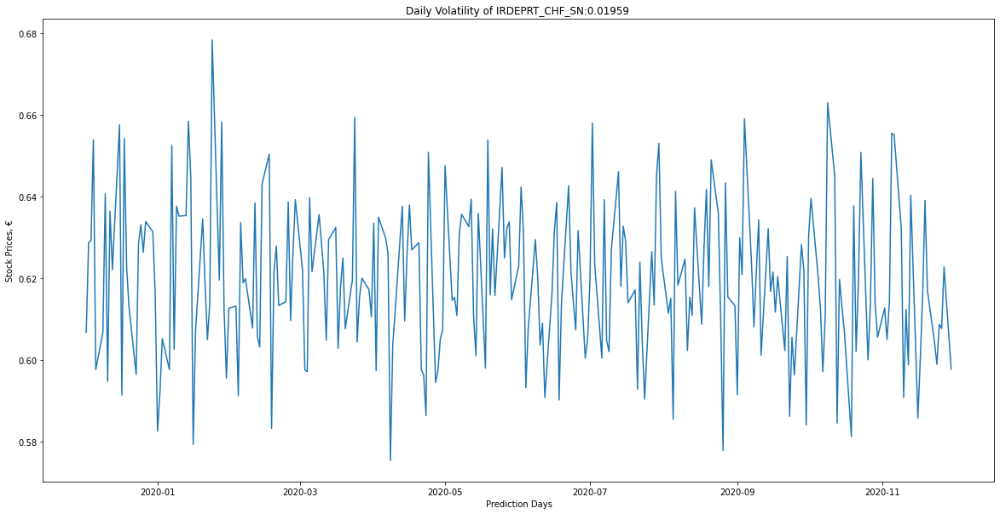

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_SN
Name: INSTRUMENT_IDENTIFIER, dtype: object


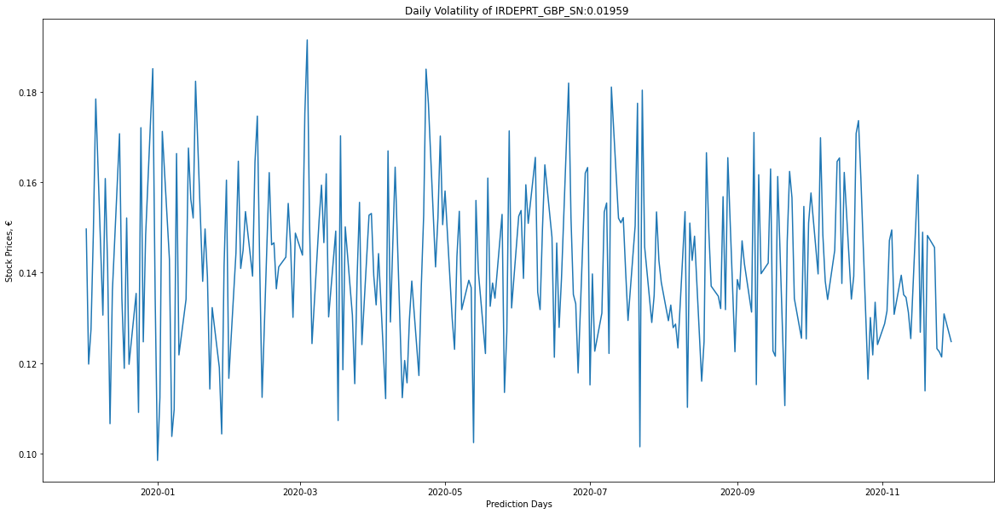

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_SN
Name: INSTRUMENT_IDENTIFIER, dtype: object


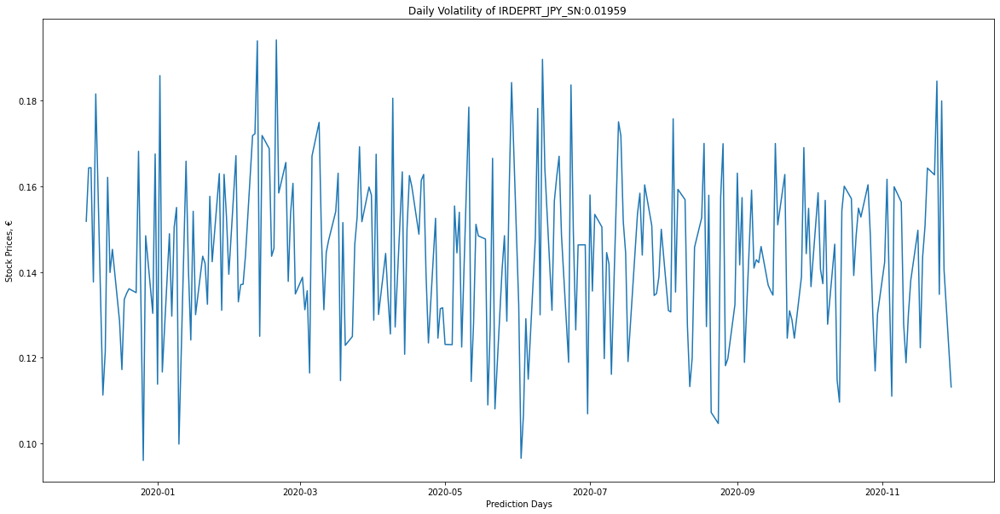

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_SN
Name: INSTRUMENT_IDENTIFIER, dtype: object


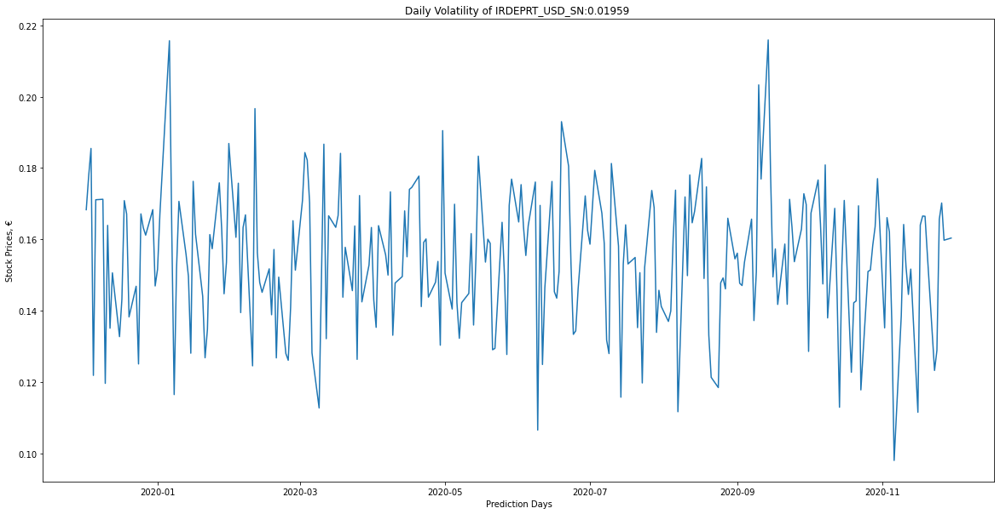

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_TN
Name: INSTRUMENT_IDENTIFIER, dtype: object


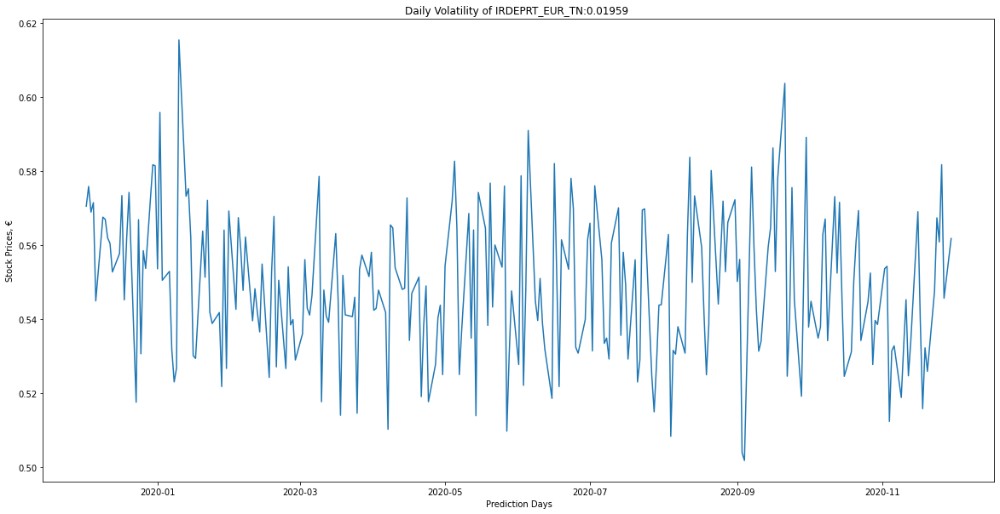

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_TN
Name: INSTRUMENT_IDENTIFIER, dtype: object


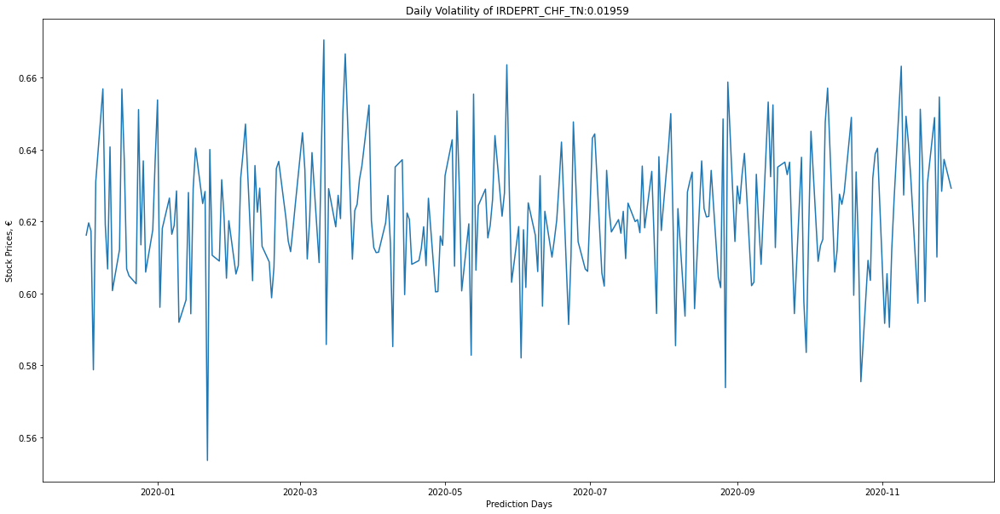

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_TN
Name: INSTRUMENT_IDENTIFIER, dtype: object


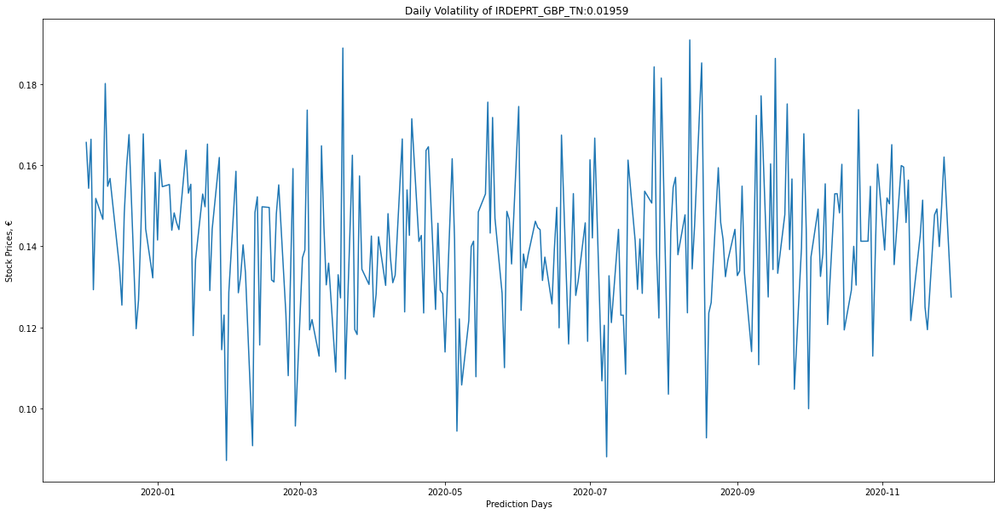

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_TN
Name: INSTRUMENT_IDENTIFIER, dtype: object


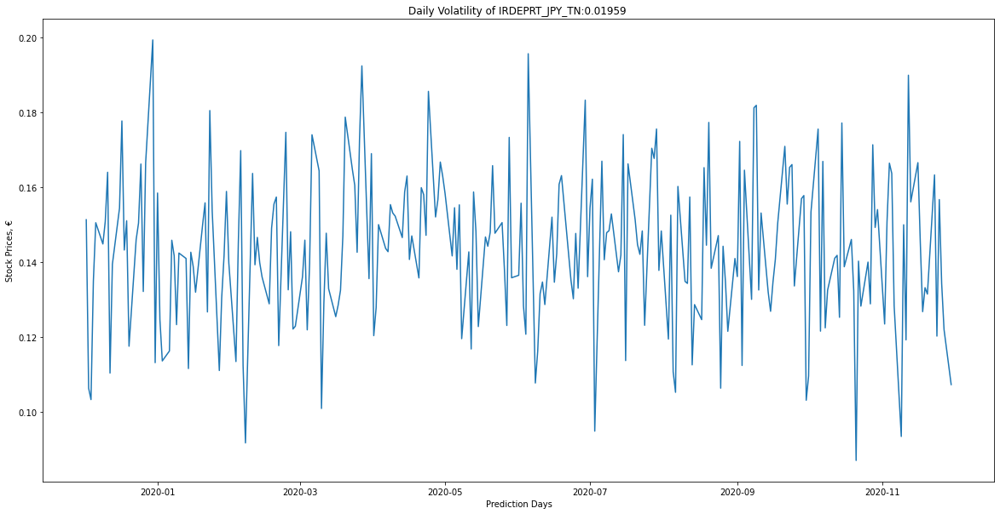

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_TN
Name: INSTRUMENT_IDENTIFIER, dtype: object


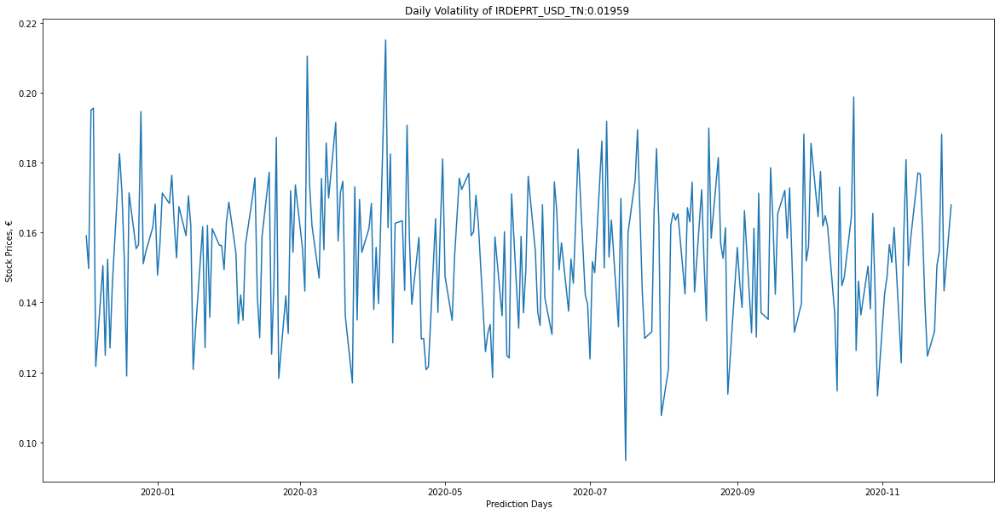

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_1W
Name: INSTRUMENT_IDENTIFIER, dtype: object


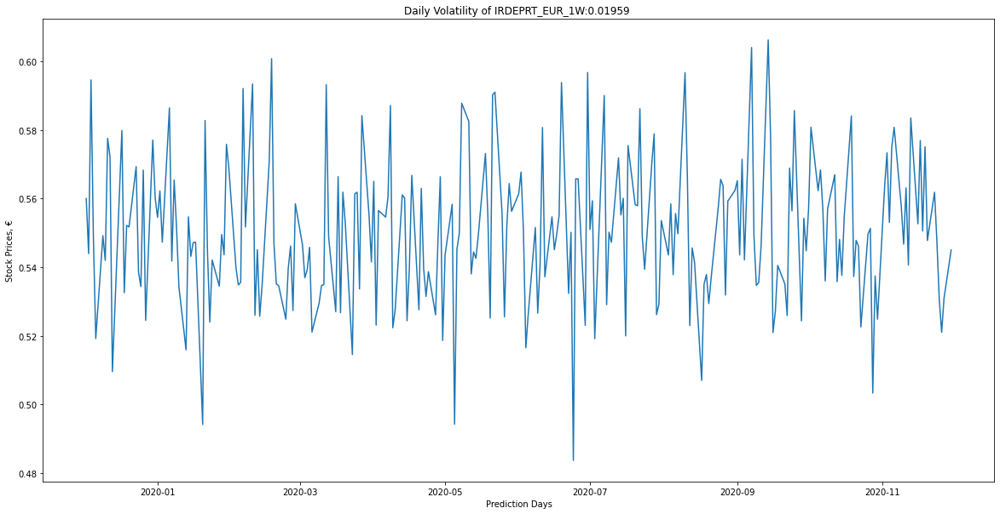

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_1W
Name: INSTRUMENT_IDENTIFIER, dtype: object


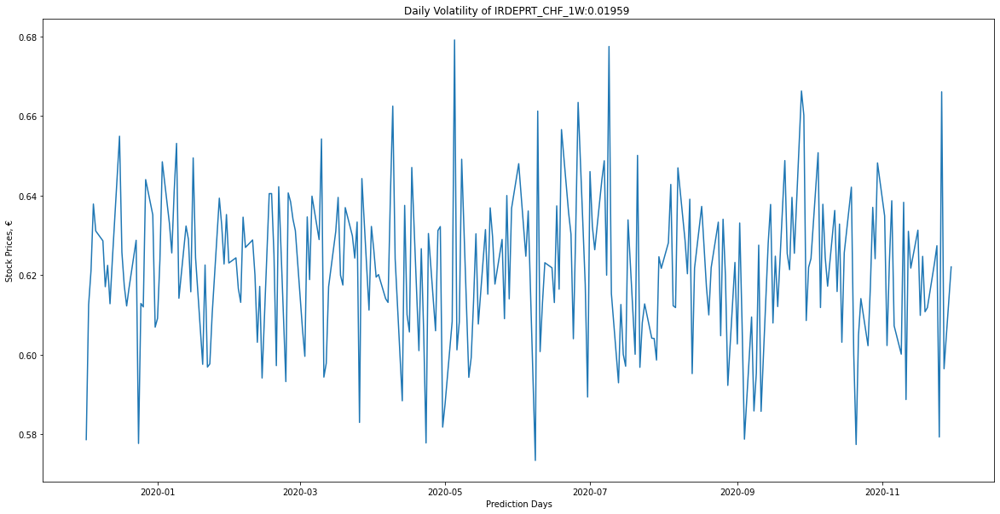

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_1W
Name: INSTRUMENT_IDENTIFIER, dtype: object


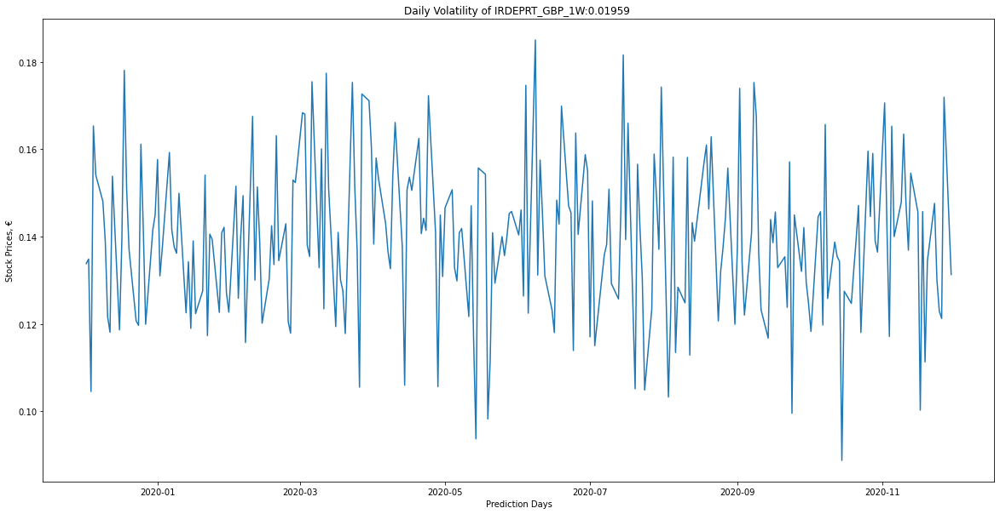

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_1W
Name: INSTRUMENT_IDENTIFIER, dtype: object


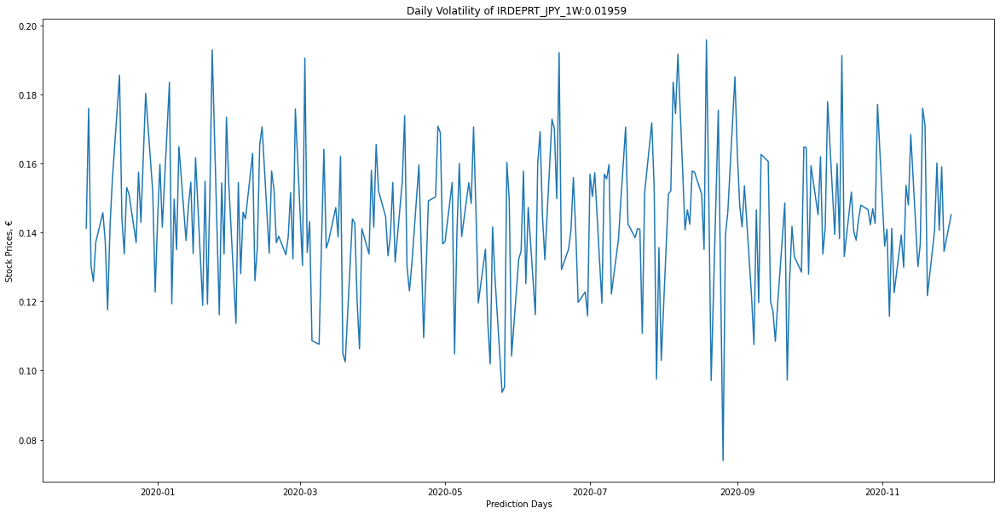

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_1W
Name: INSTRUMENT_IDENTIFIER, dtype: object


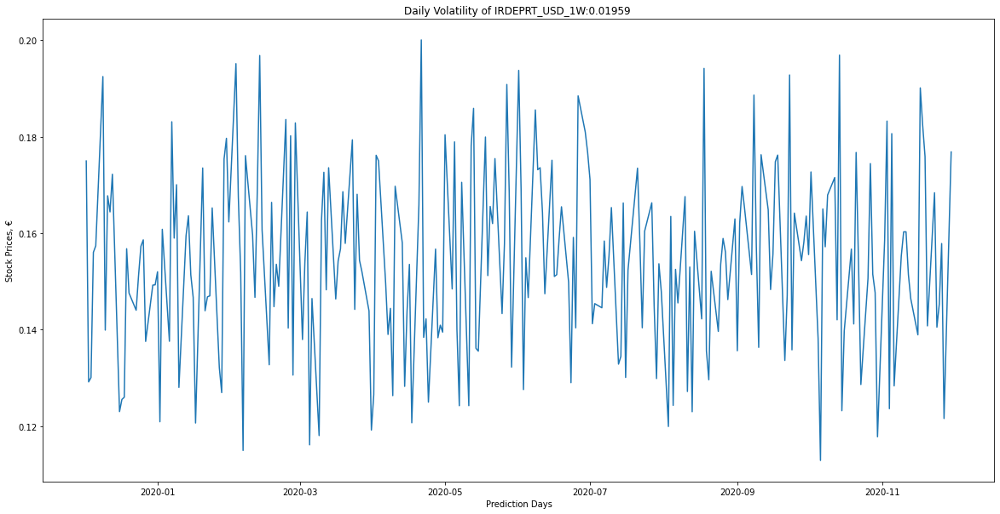

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_2W
Name: INSTRUMENT_IDENTIFIER, dtype: object


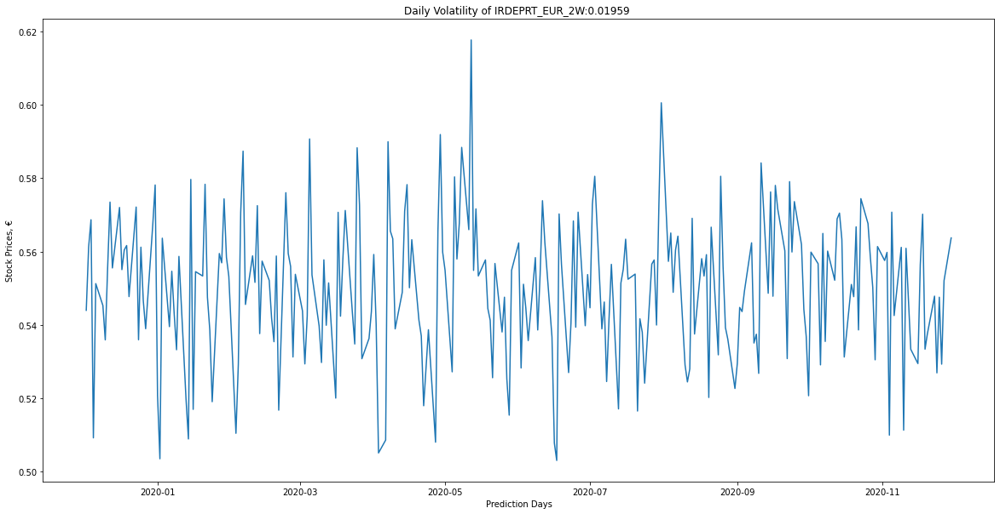

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_2W
Name: INSTRUMENT_IDENTIFIER, dtype: object


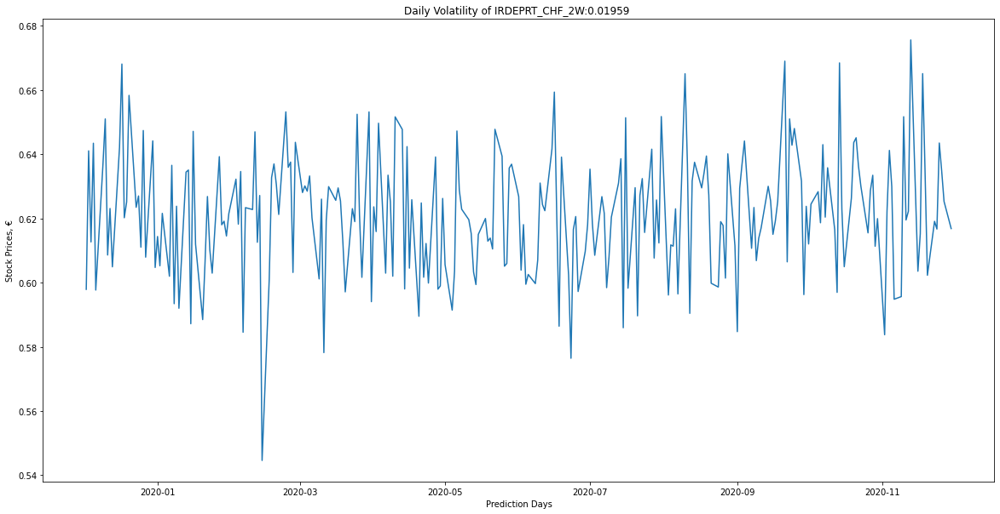

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_2W
Name: INSTRUMENT_IDENTIFIER, dtype: object


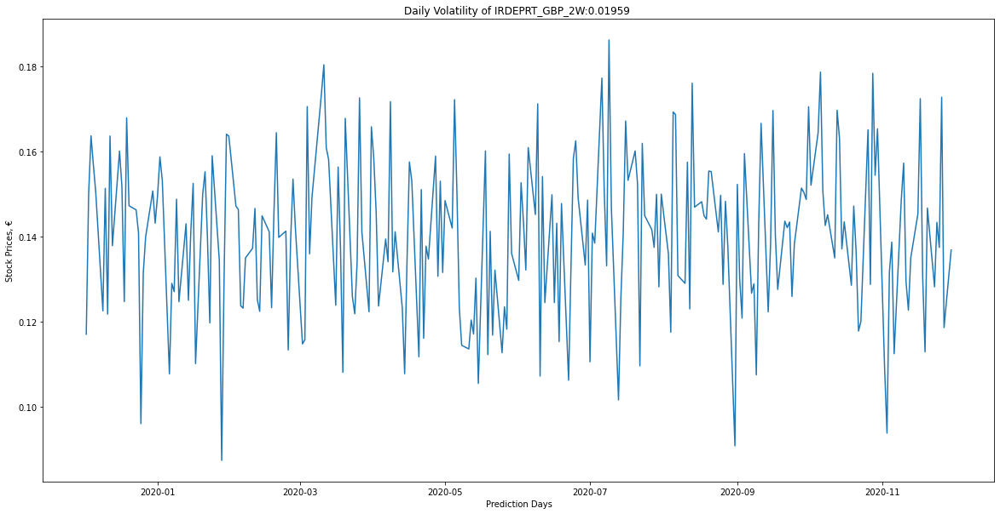

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_2W
Name: INSTRUMENT_IDENTIFIER, dtype: object


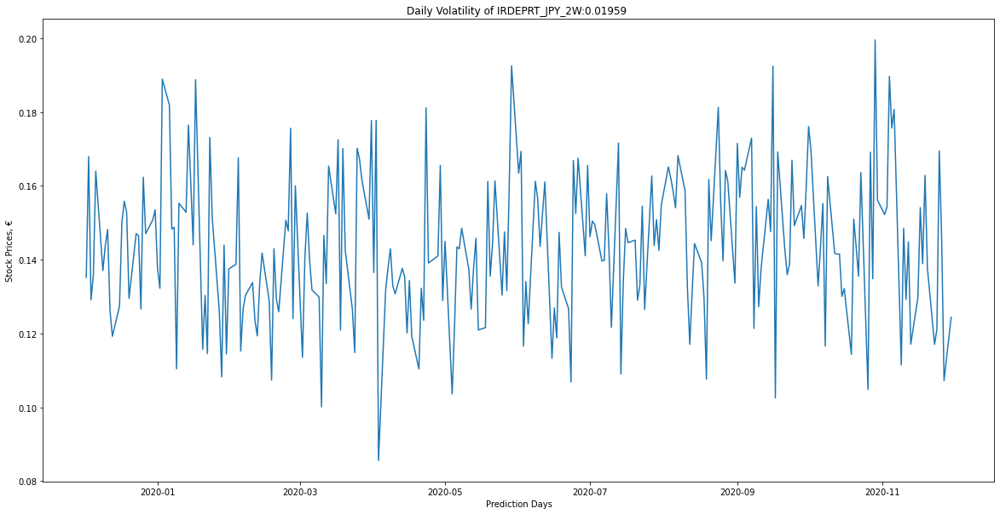

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_2W
Name: INSTRUMENT_IDENTIFIER, dtype: object


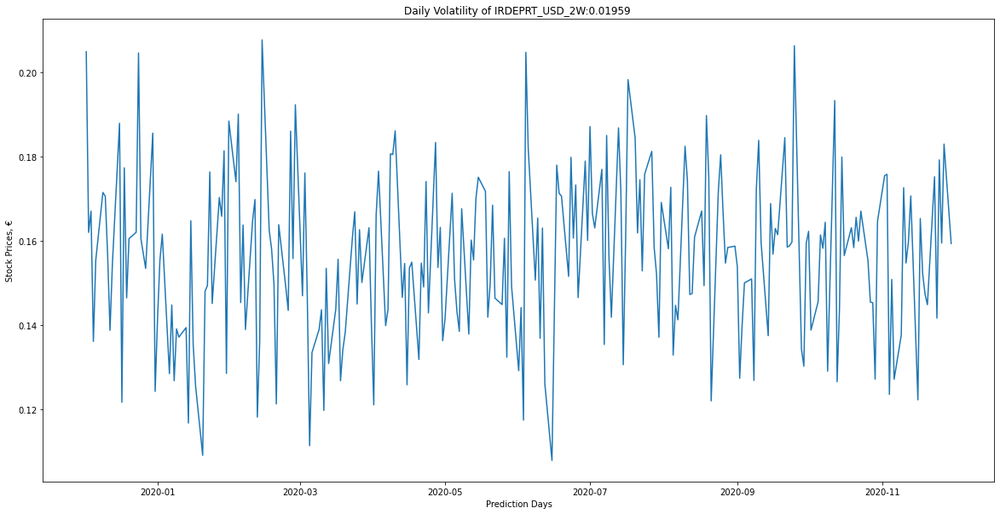

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_3W
Name: INSTRUMENT_IDENTIFIER, dtype: object


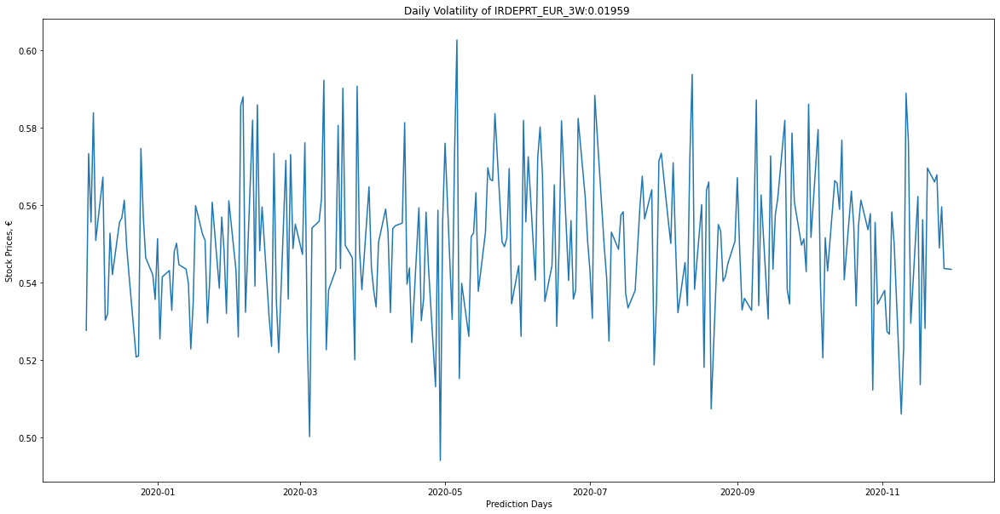

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_3W
Name: INSTRUMENT_IDENTIFIER, dtype: object


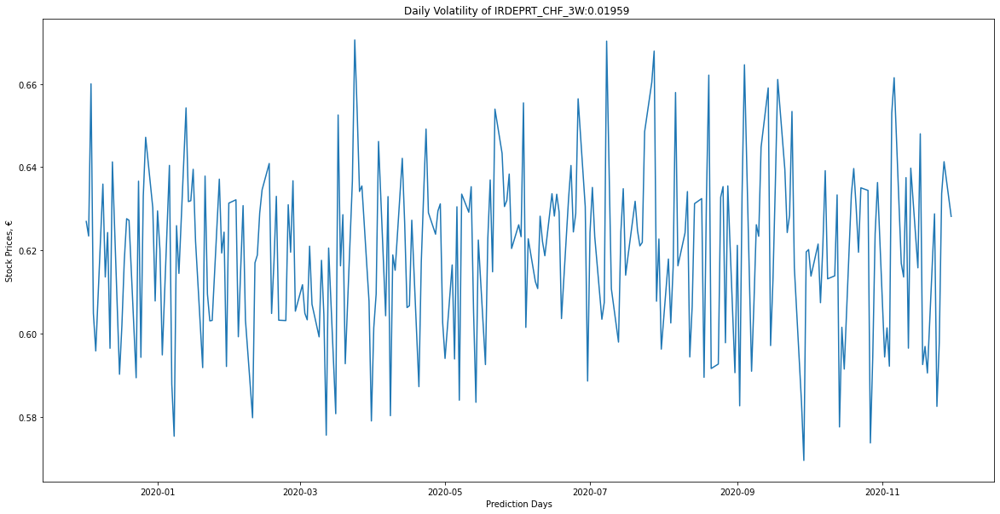

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_3W
Name: INSTRUMENT_IDENTIFIER, dtype: object


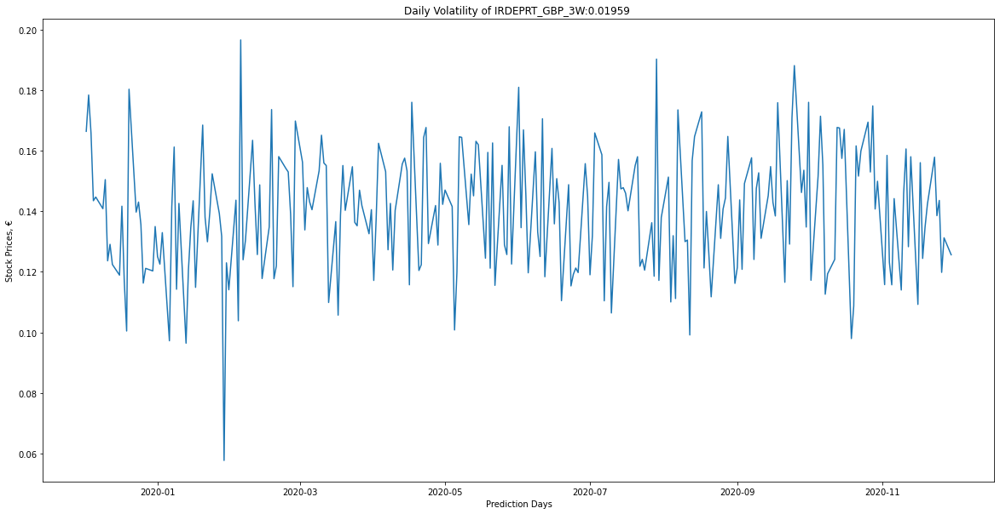

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_3W
Name: INSTRUMENT_IDENTIFIER, dtype: object


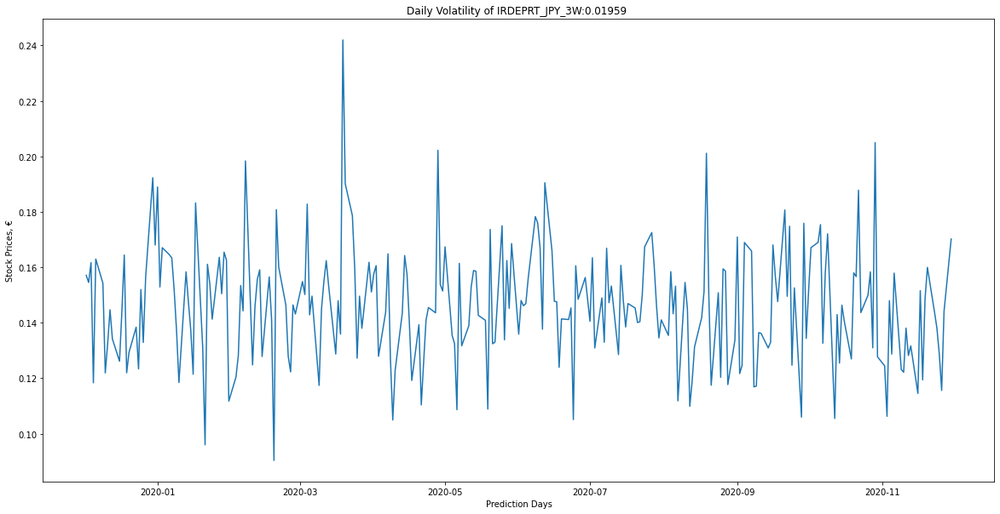

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_3W
Name: INSTRUMENT_IDENTIFIER, dtype: object


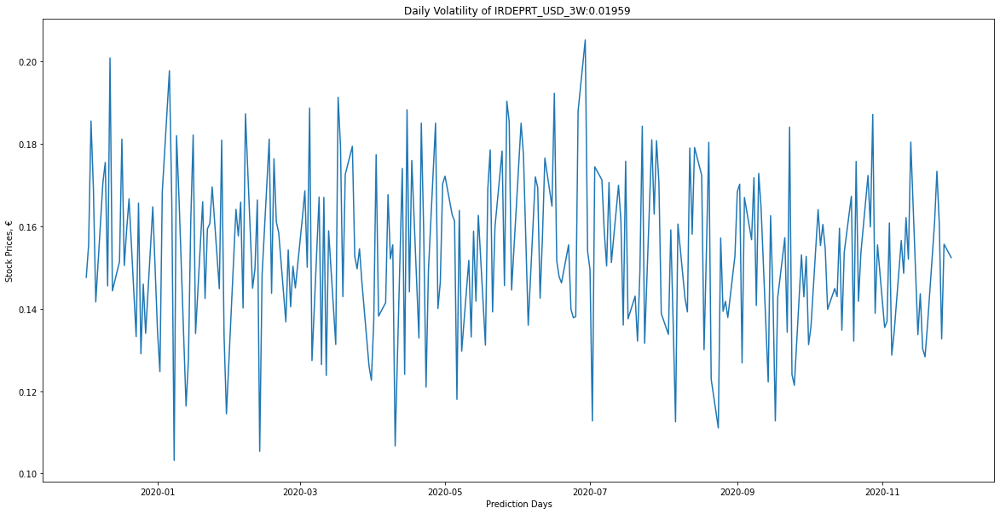

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_1M
Name: INSTRUMENT_IDENTIFIER, dtype: object


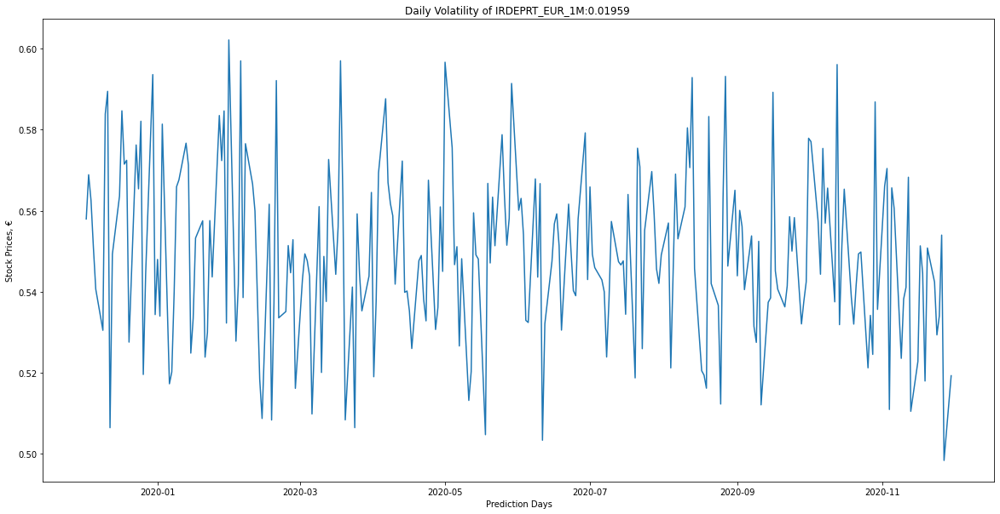

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_1M
Name: INSTRUMENT_IDENTIFIER, dtype: object


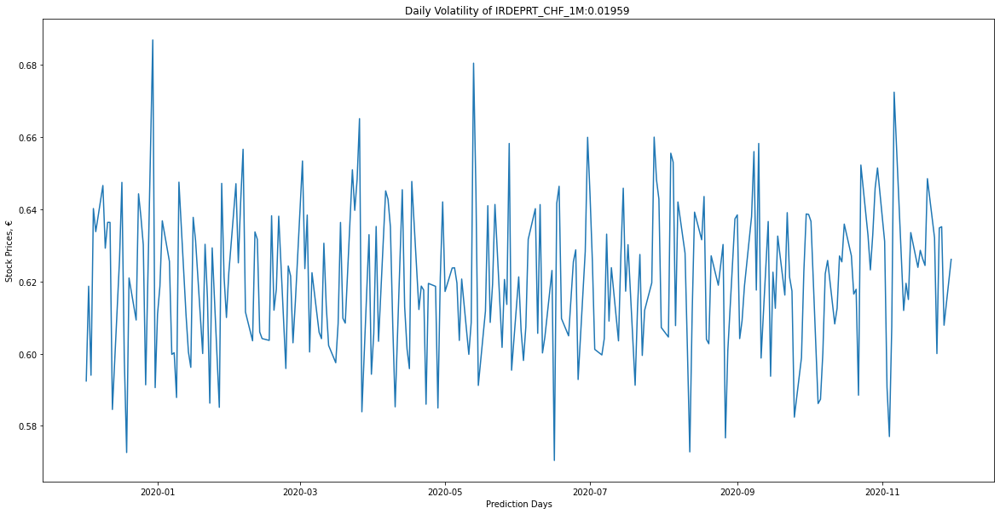

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_1M
Name: INSTRUMENT_IDENTIFIER, dtype: object


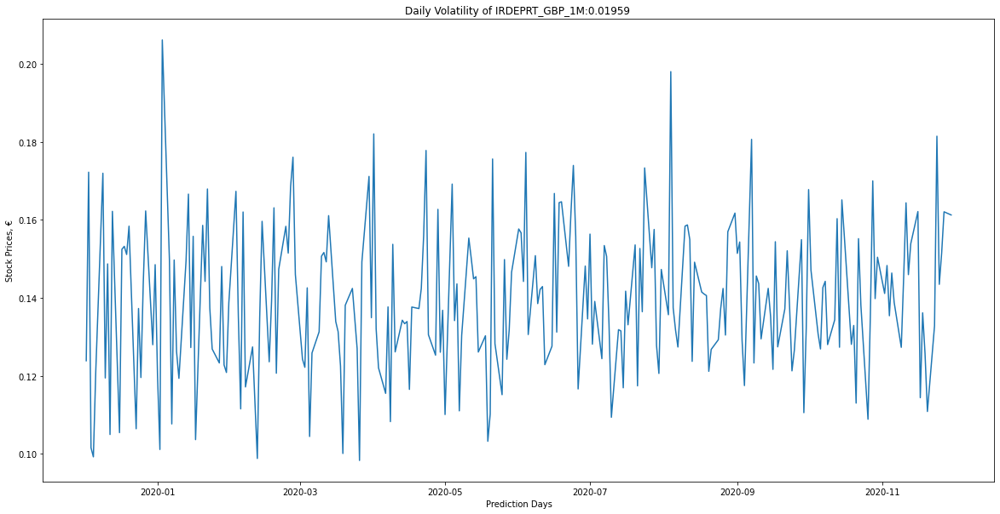

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_1M
Name: INSTRUMENT_IDENTIFIER, dtype: object


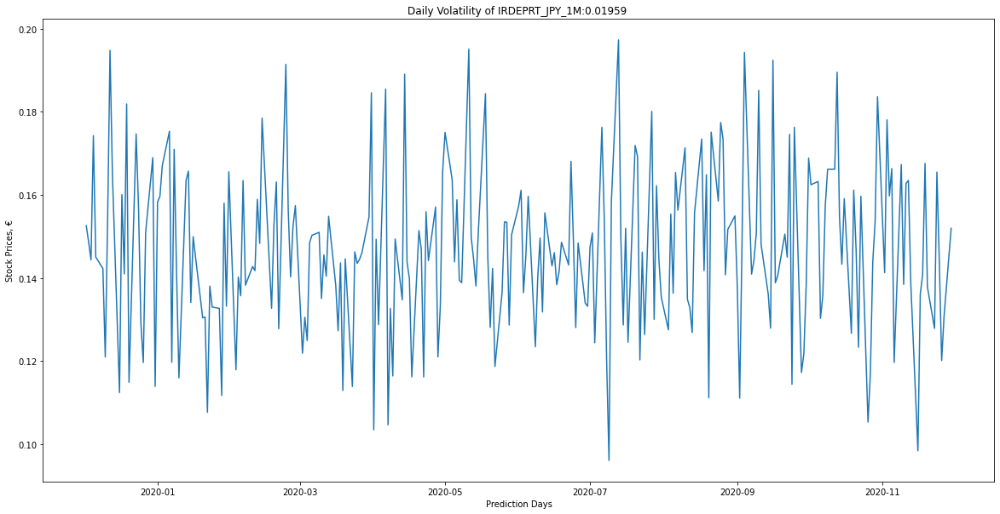

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_1M
Name: INSTRUMENT_IDENTIFIER, dtype: object


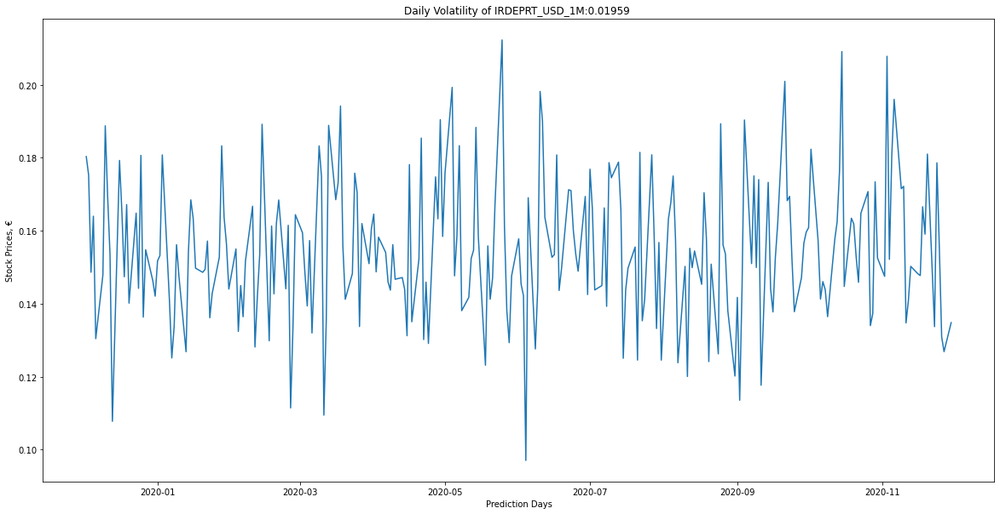

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_2M
Name: INSTRUMENT_IDENTIFIER, dtype: object


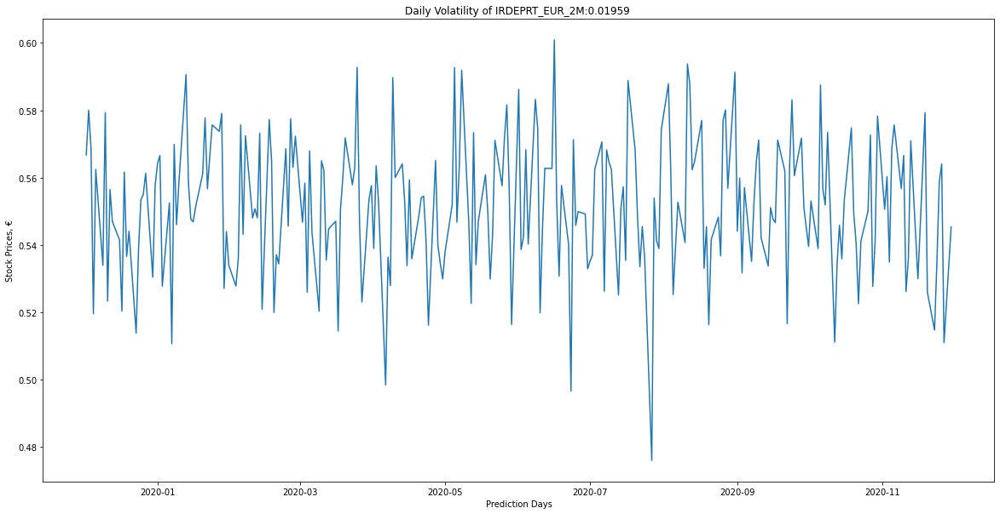

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_2M
Name: INSTRUMENT_IDENTIFIER, dtype: object


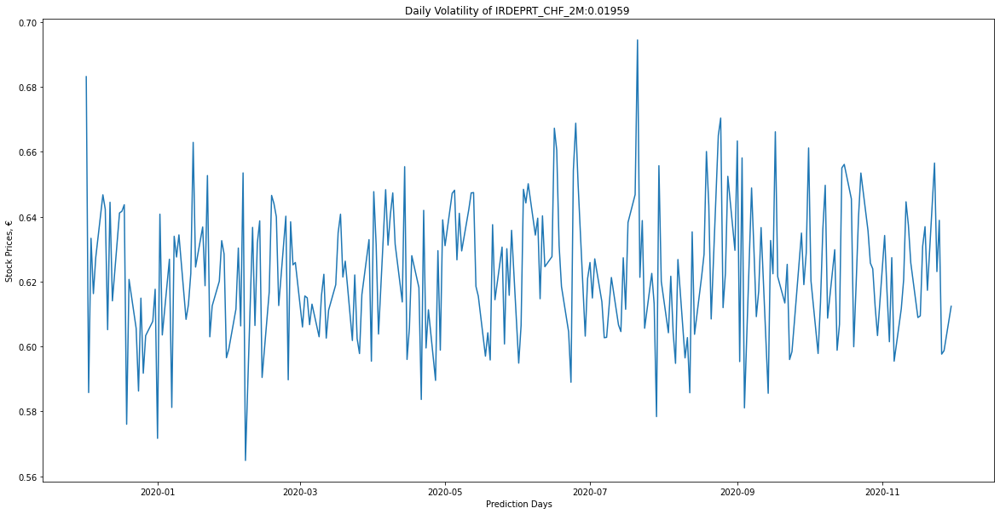

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_2M
Name: INSTRUMENT_IDENTIFIER, dtype: object


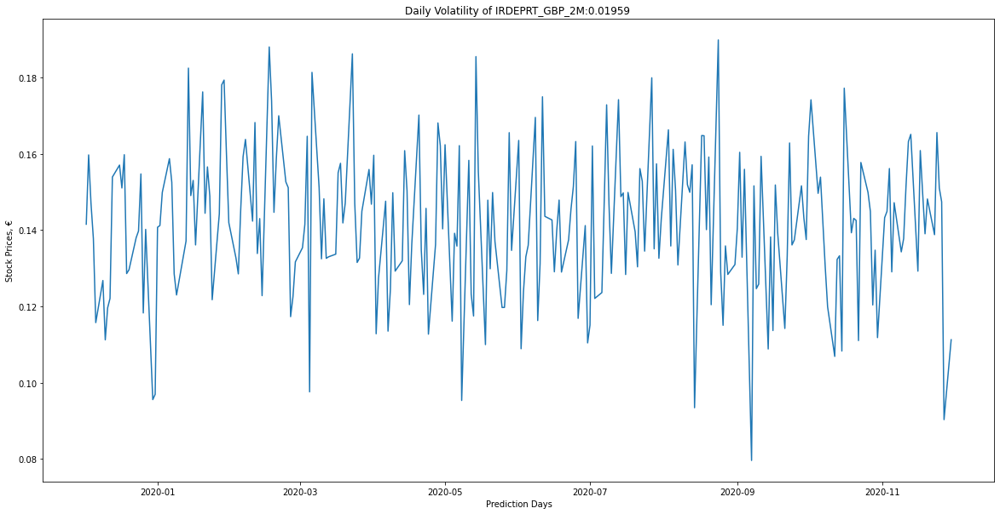

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_2M
Name: INSTRUMENT_IDENTIFIER, dtype: object


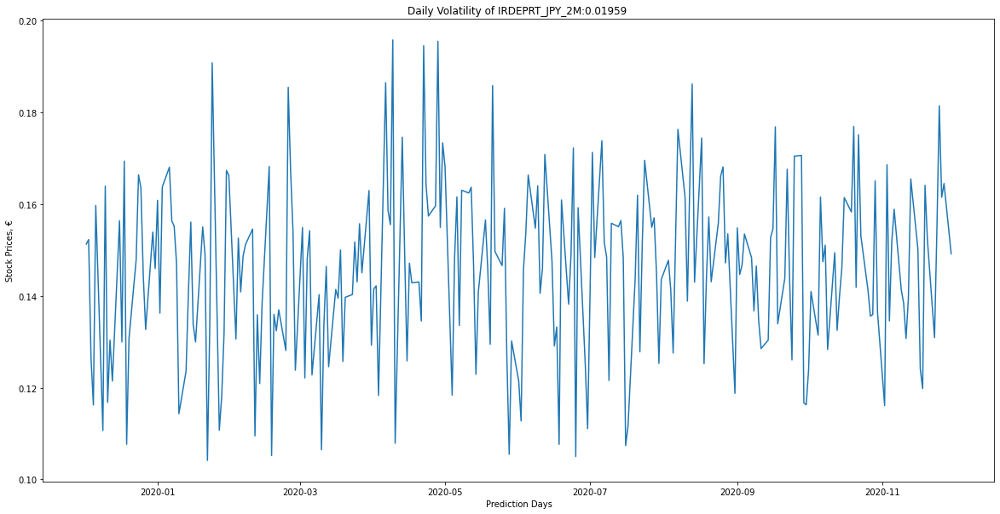

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_2M
Name: INSTRUMENT_IDENTIFIER, dtype: object


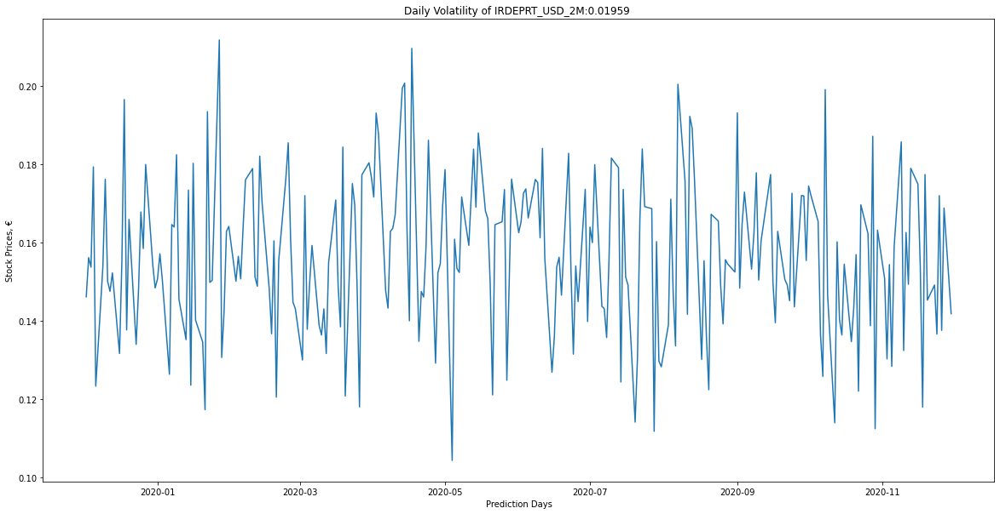

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_3M
Name: INSTRUMENT_IDENTIFIER, dtype: object


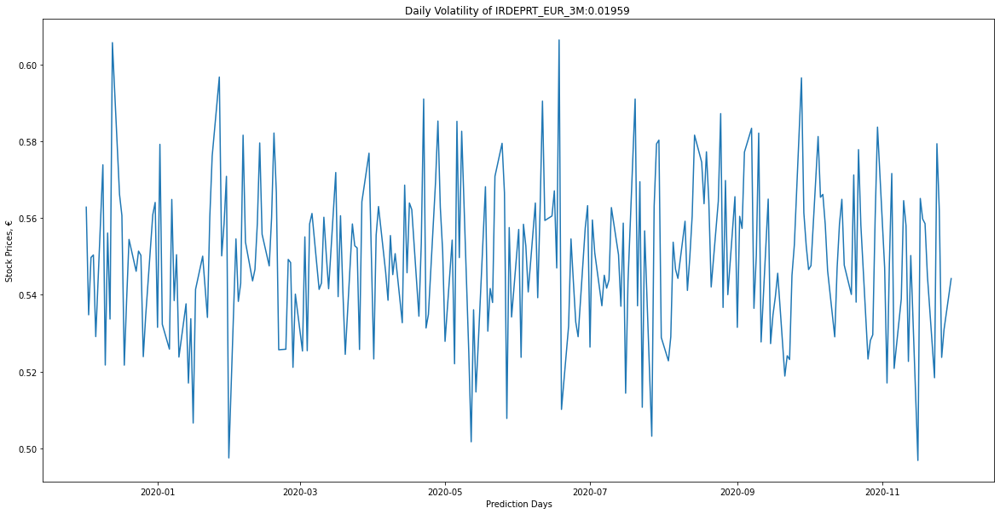

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_3M
Name: INSTRUMENT_IDENTIFIER, dtype: object


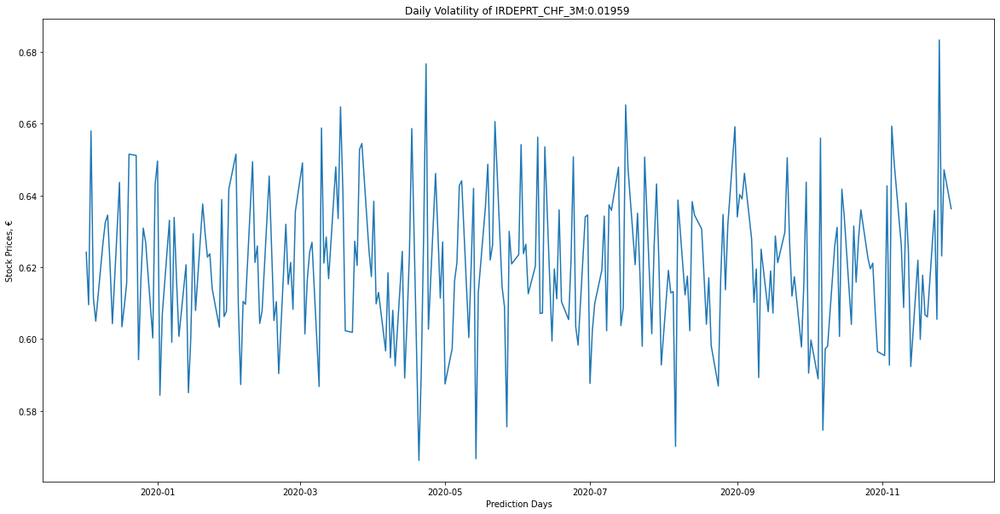

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_3M
Name: INSTRUMENT_IDENTIFIER, dtype: object


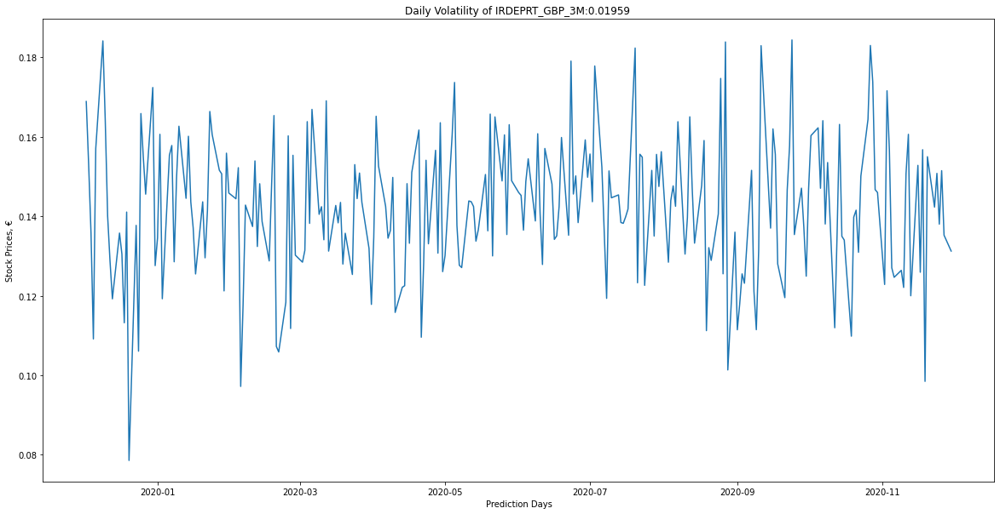

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_3M
Name: INSTRUMENT_IDENTIFIER, dtype: object


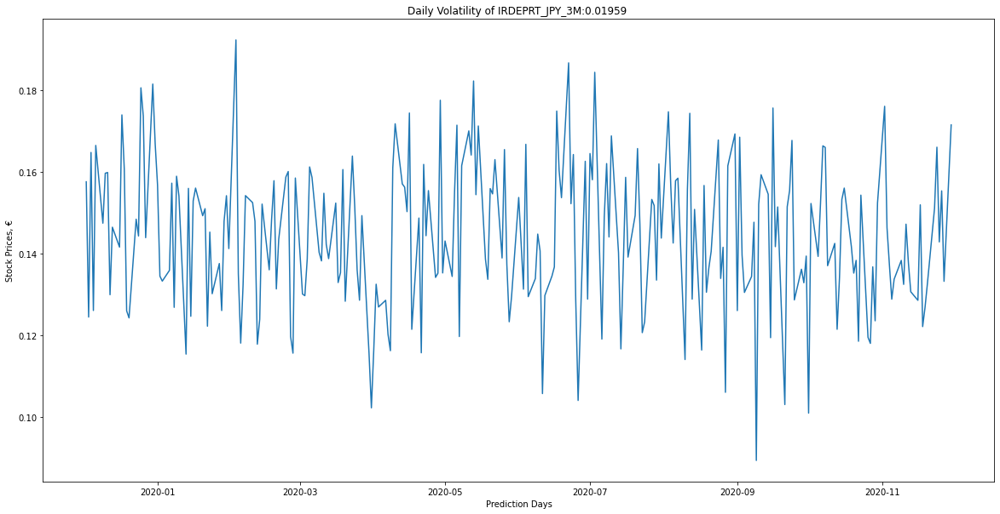

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_3M
Name: INSTRUMENT_IDENTIFIER, dtype: object


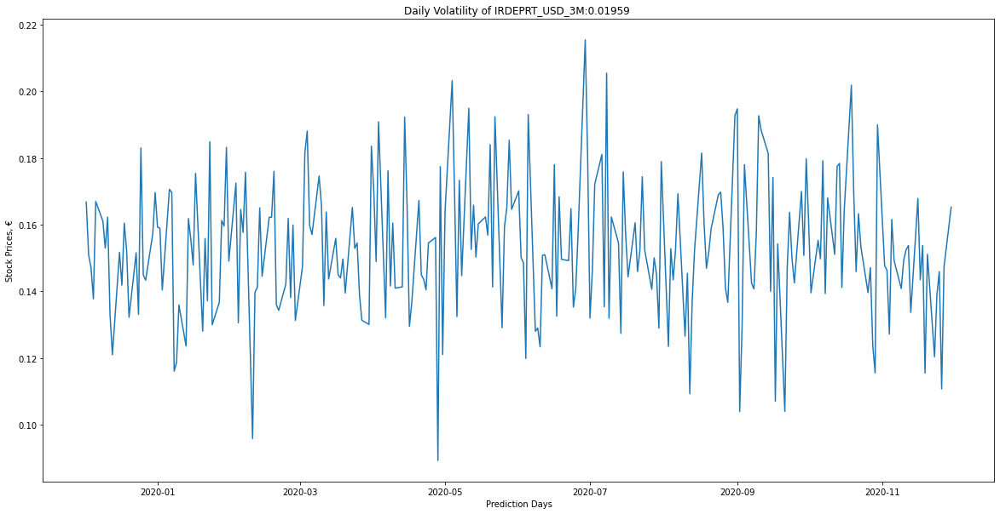

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_4M
Name: INSTRUMENT_IDENTIFIER, dtype: object


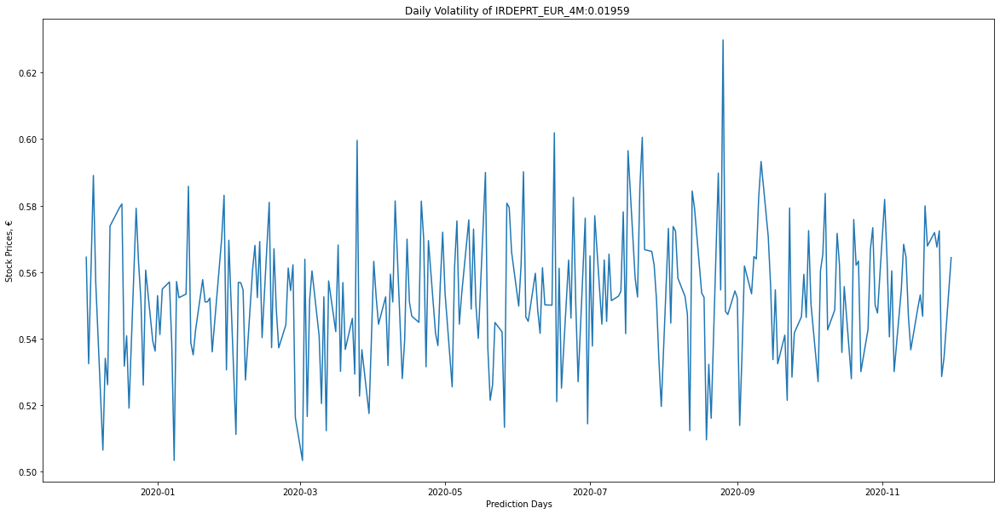

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_4M
Name: INSTRUMENT_IDENTIFIER, dtype: object


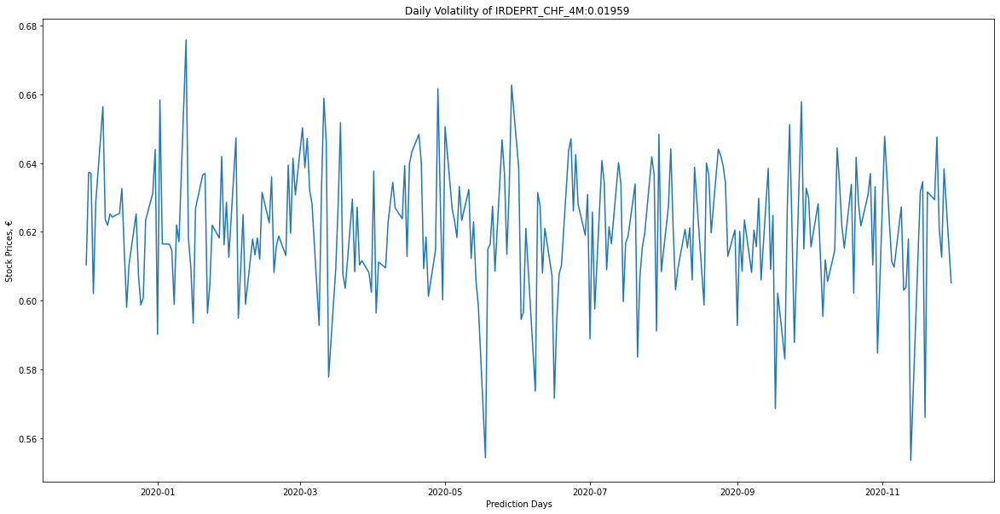

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_4M
Name: INSTRUMENT_IDENTIFIER, dtype: object


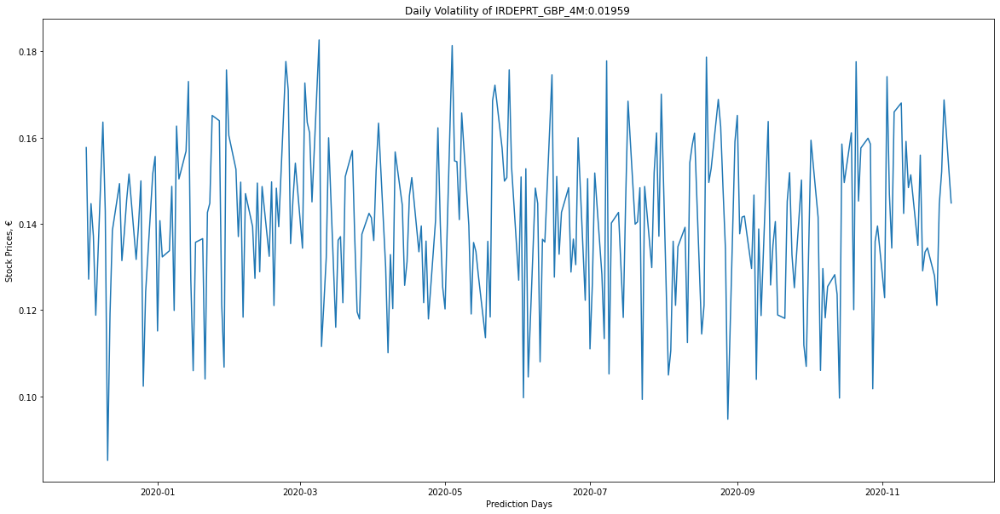

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_4M
Name: INSTRUMENT_IDENTIFIER, dtype: object


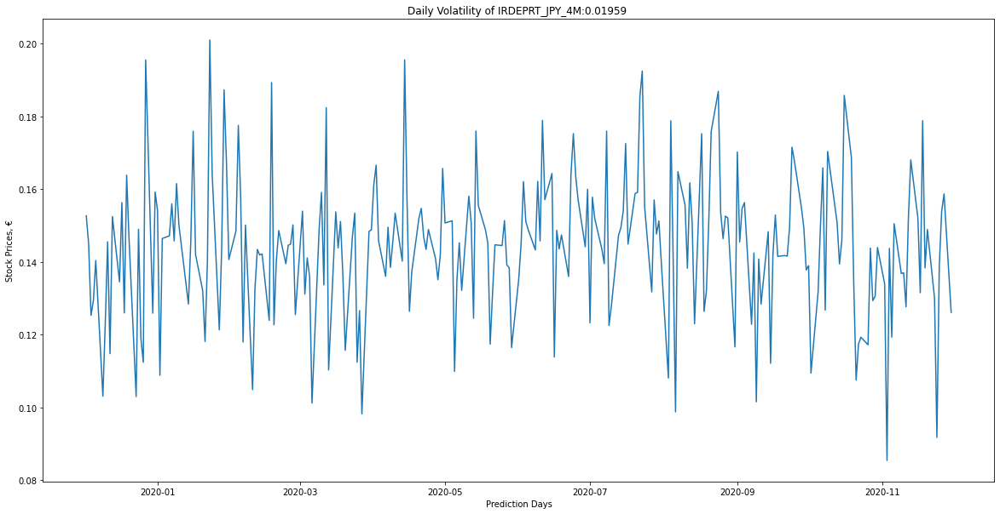

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_4M
Name: INSTRUMENT_IDENTIFIER, dtype: object


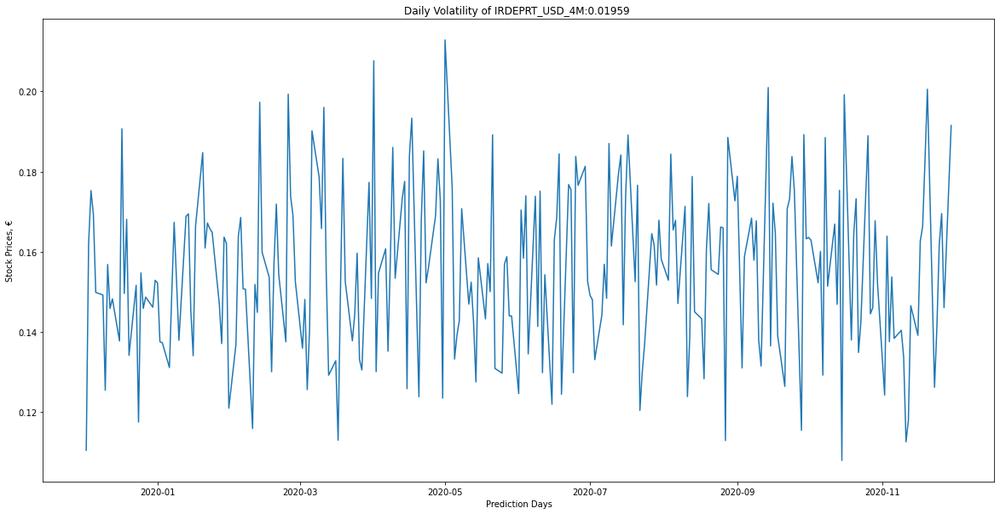

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_5M
Name: INSTRUMENT_IDENTIFIER, dtype: object


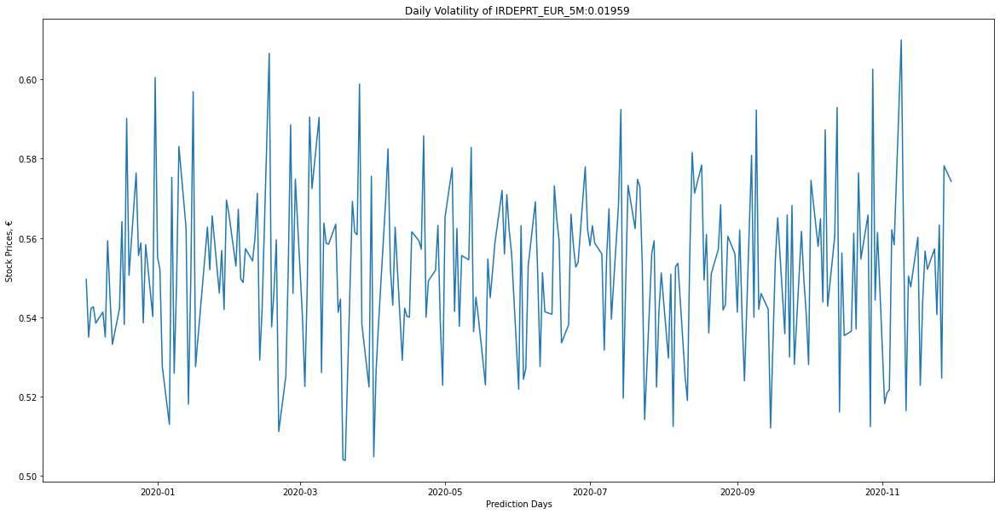

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_5M
Name: INSTRUMENT_IDENTIFIER, dtype: object


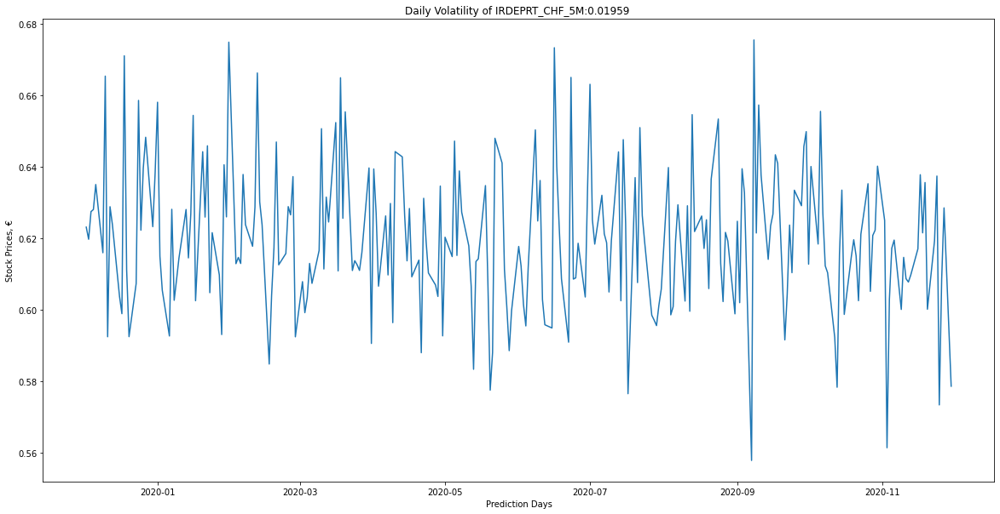

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_5M
Name: INSTRUMENT_IDENTIFIER, dtype: object


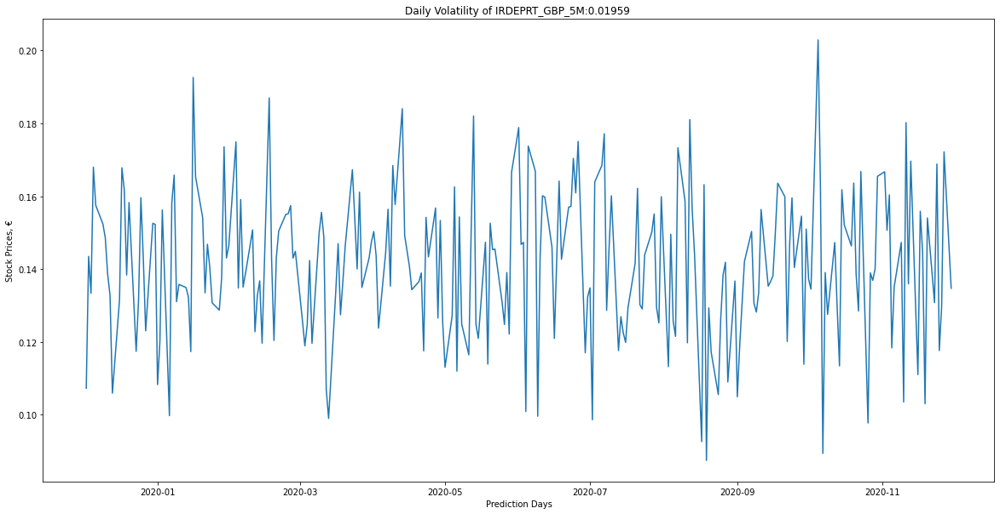

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_5M
Name: INSTRUMENT_IDENTIFIER, dtype: object


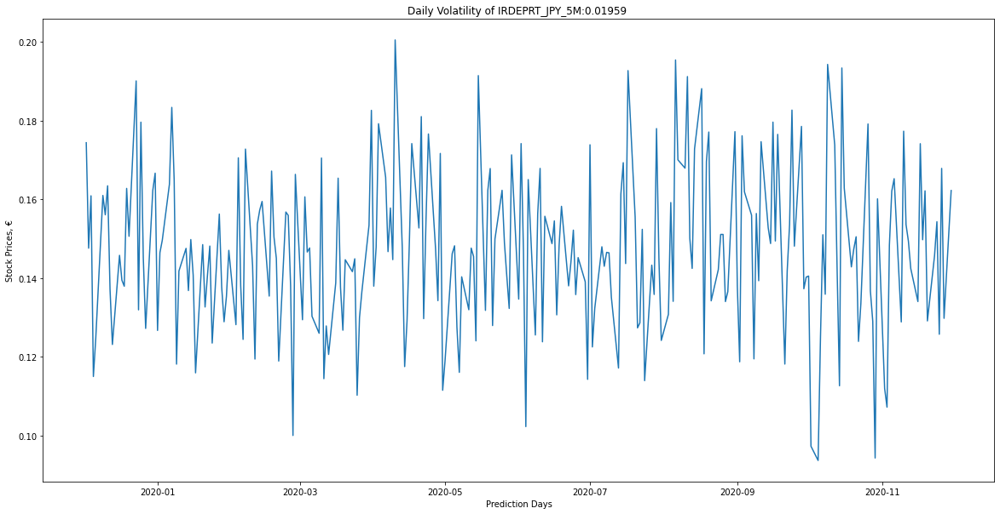

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_5M
Name: INSTRUMENT_IDENTIFIER, dtype: object


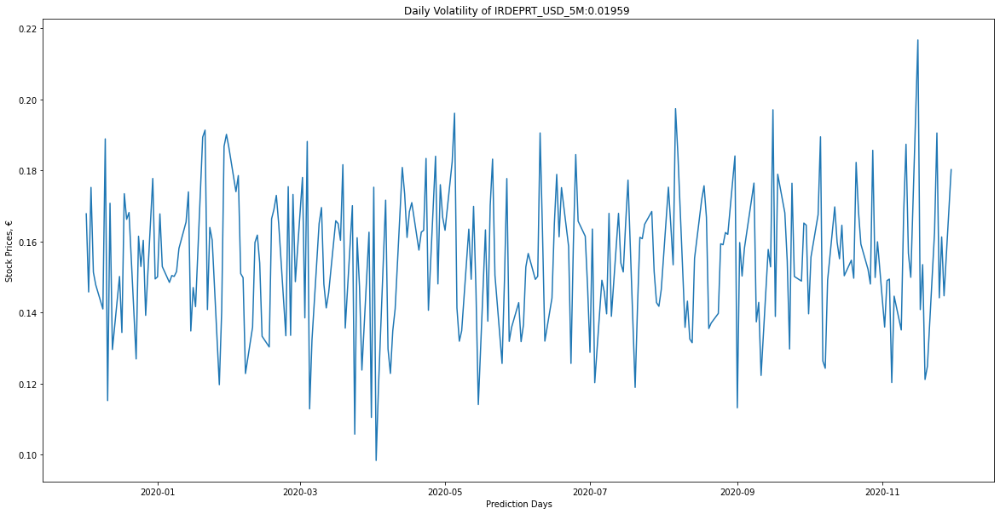

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_6M
Name: INSTRUMENT_IDENTIFIER, dtype: object


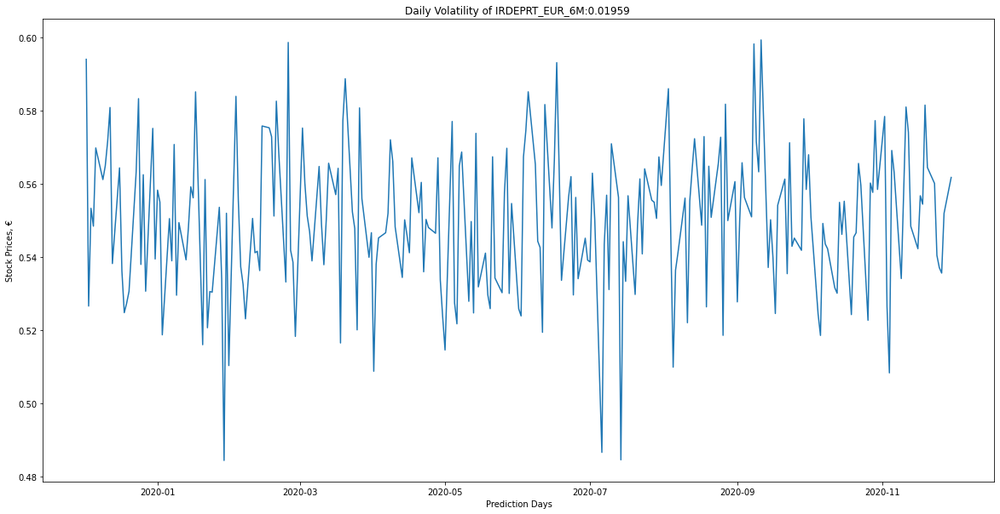

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_6M
Name: INSTRUMENT_IDENTIFIER, dtype: object


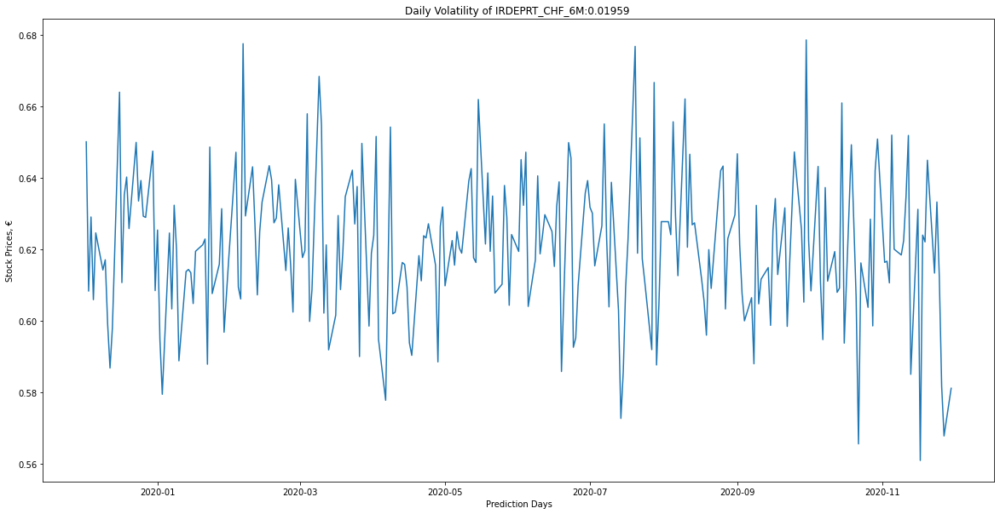

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_6M
Name: INSTRUMENT_IDENTIFIER, dtype: object


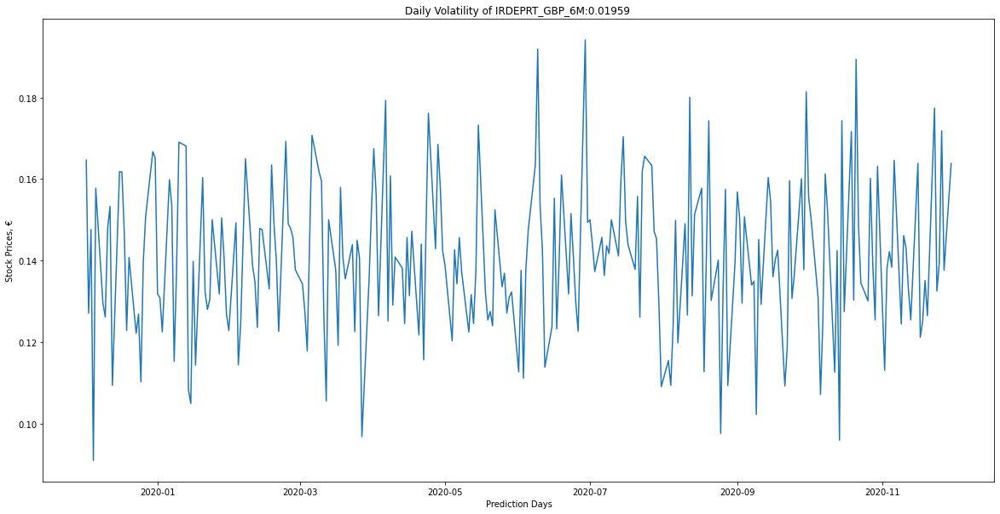

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_6M
Name: INSTRUMENT_IDENTIFIER, dtype: object


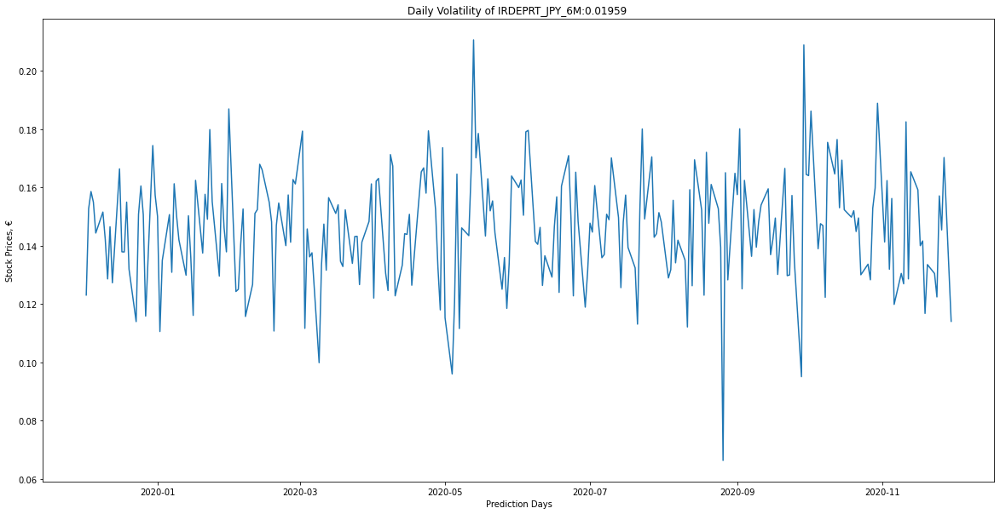

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_6M
Name: INSTRUMENT_IDENTIFIER, dtype: object


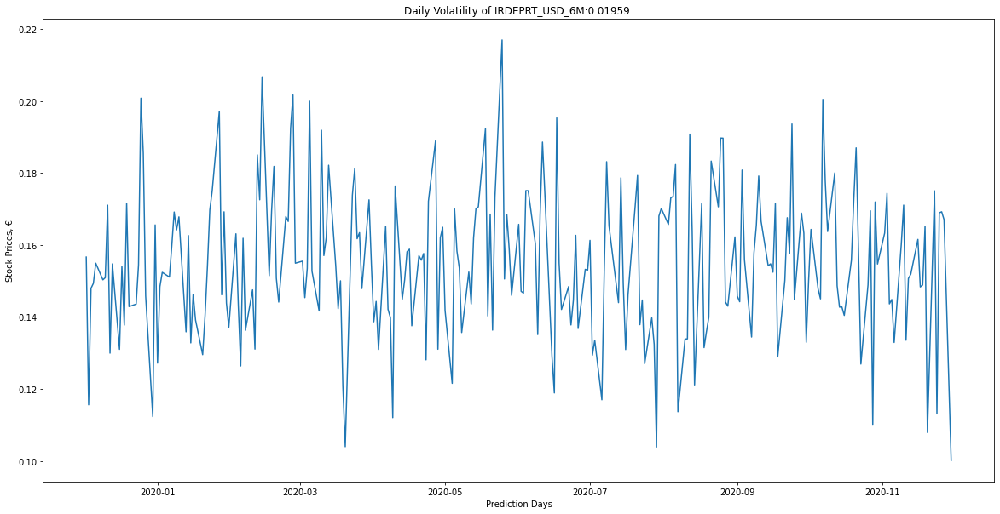

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_7M
Name: INSTRUMENT_IDENTIFIER, dtype: object


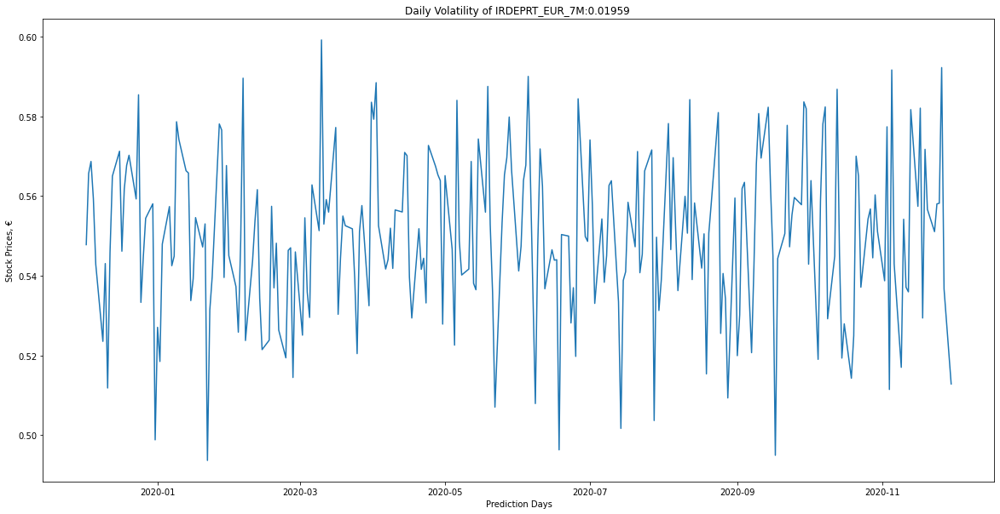

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_7M
Name: INSTRUMENT_IDENTIFIER, dtype: object


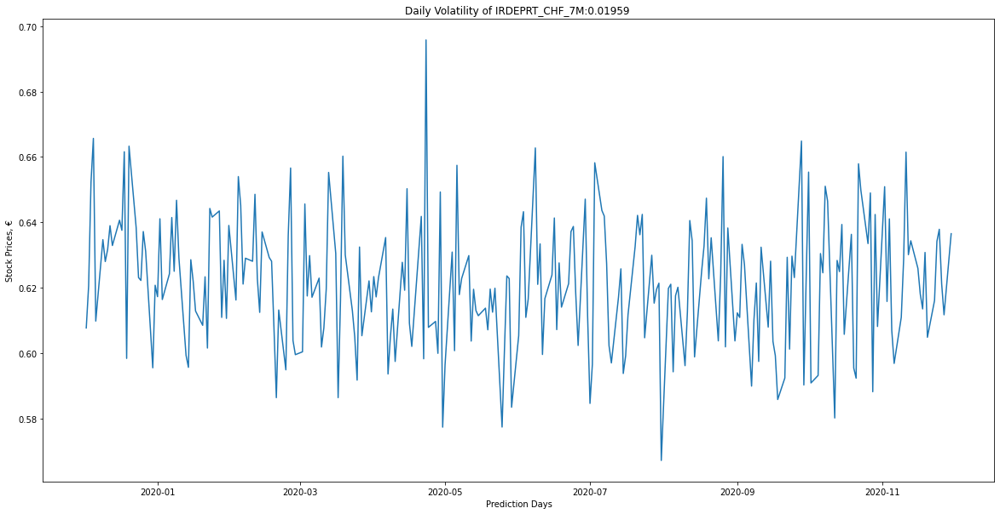

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_7M
Name: INSTRUMENT_IDENTIFIER, dtype: object


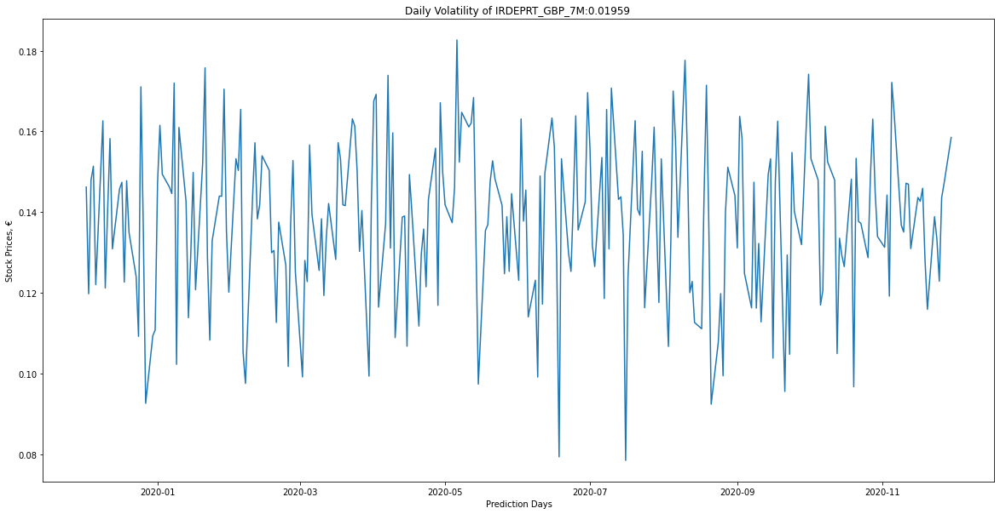

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_7M
Name: INSTRUMENT_IDENTIFIER, dtype: object


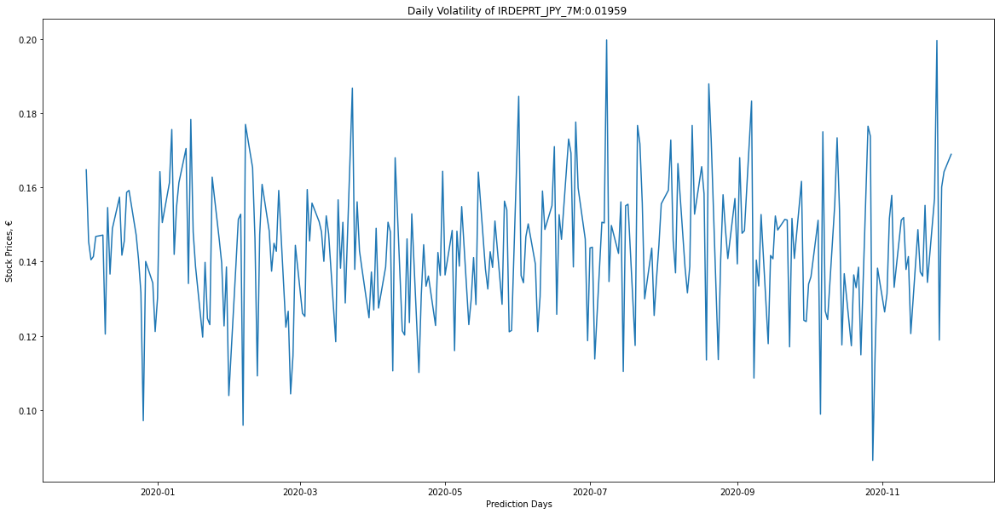

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_7M
Name: INSTRUMENT_IDENTIFIER, dtype: object


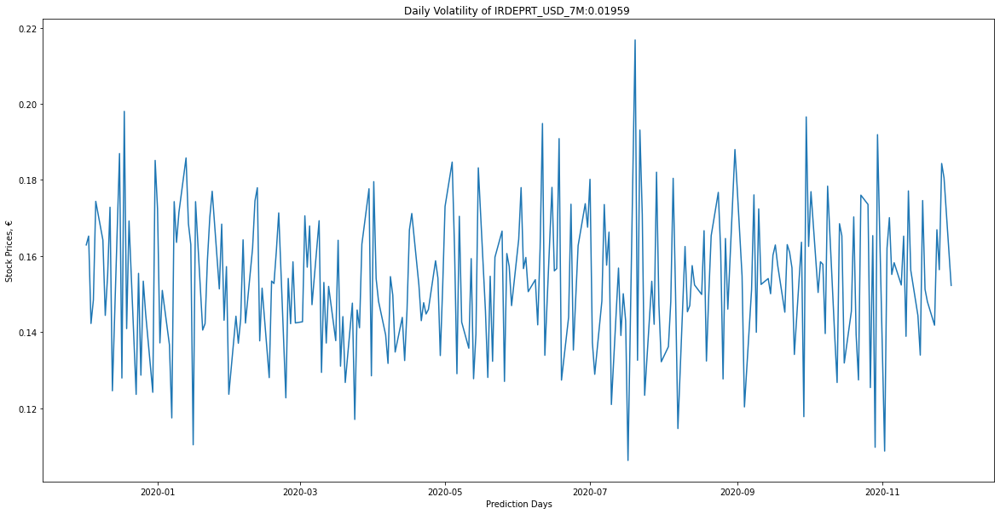

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_8M
Name: INSTRUMENT_IDENTIFIER, dtype: object


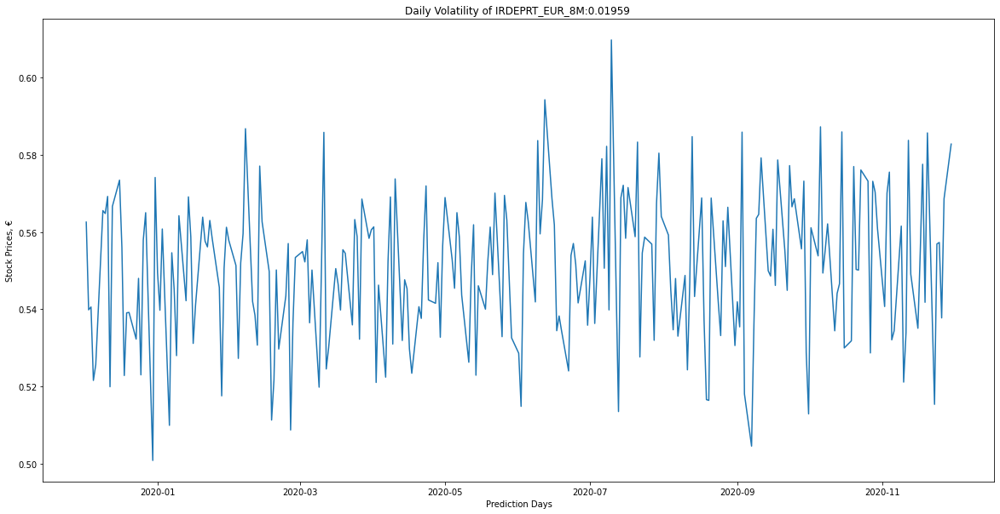

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_8M
Name: INSTRUMENT_IDENTIFIER, dtype: object


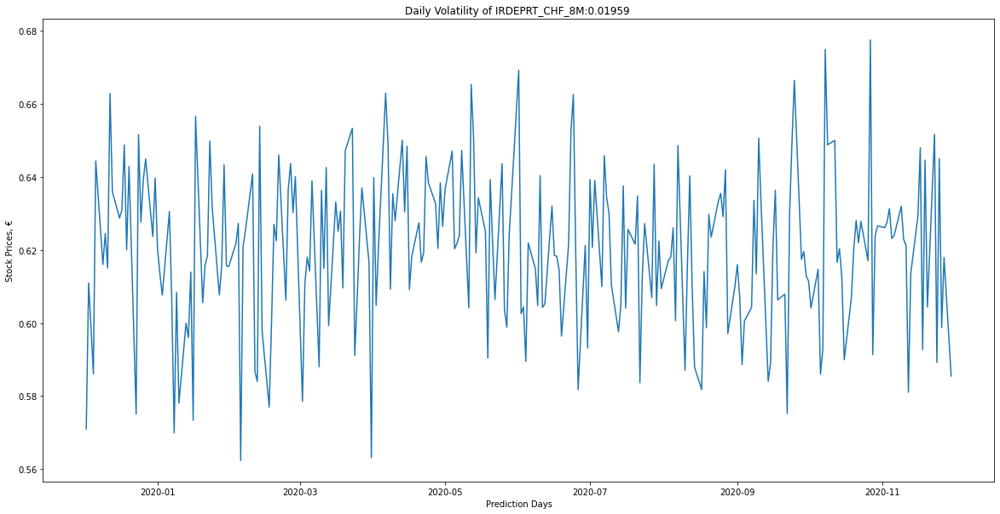

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_8M
Name: INSTRUMENT_IDENTIFIER, dtype: object


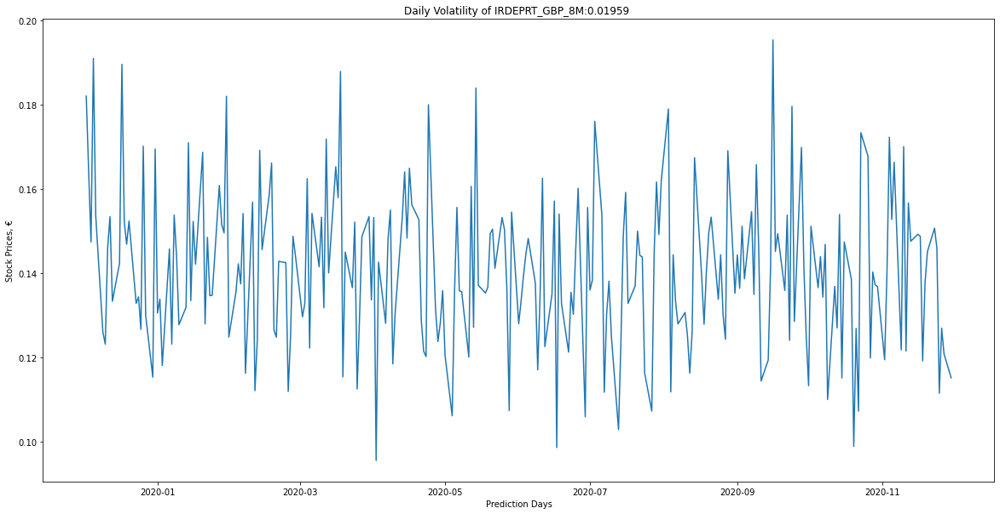

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_8M
Name: INSTRUMENT_IDENTIFIER, dtype: object


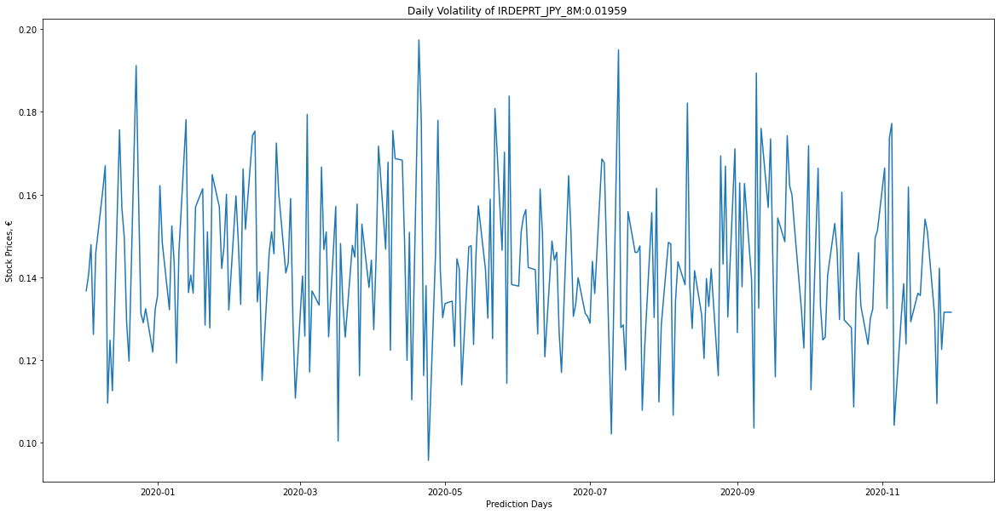

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_8M
Name: INSTRUMENT_IDENTIFIER, dtype: object


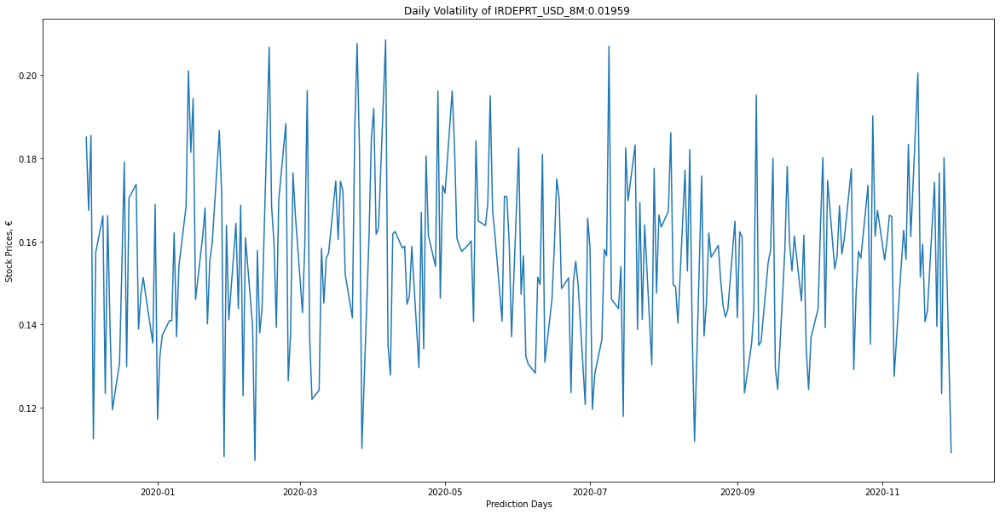

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_9M
Name: INSTRUMENT_IDENTIFIER, dtype: object


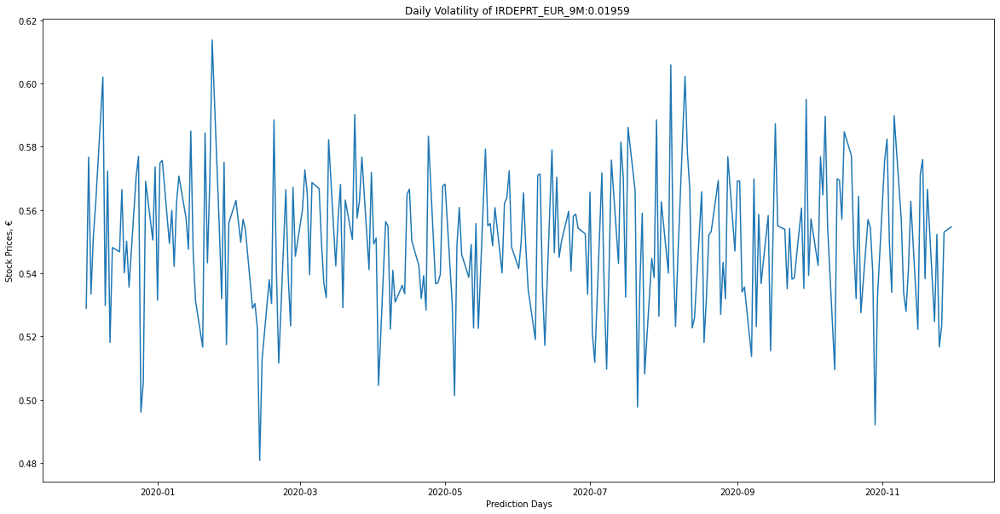

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_9M
Name: INSTRUMENT_IDENTIFIER, dtype: object


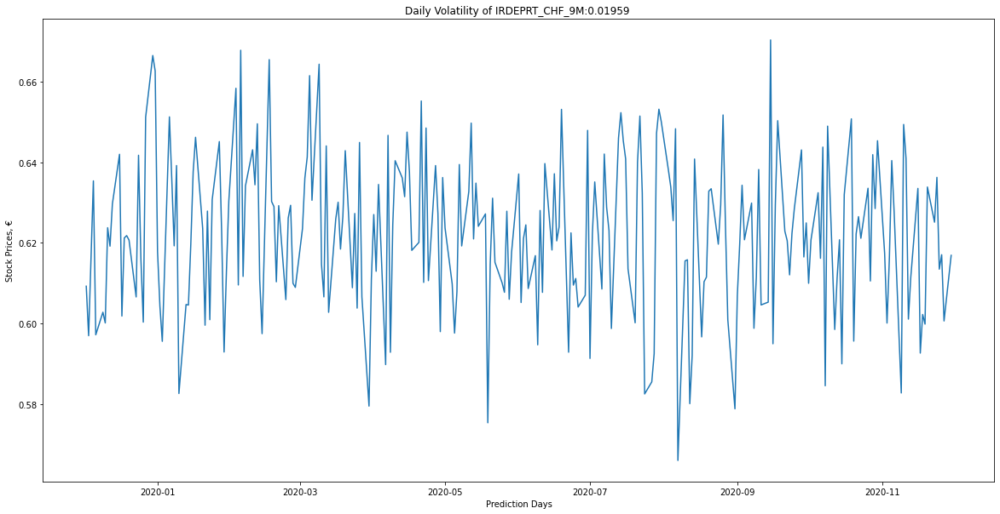

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_9M
Name: INSTRUMENT_IDENTIFIER, dtype: object


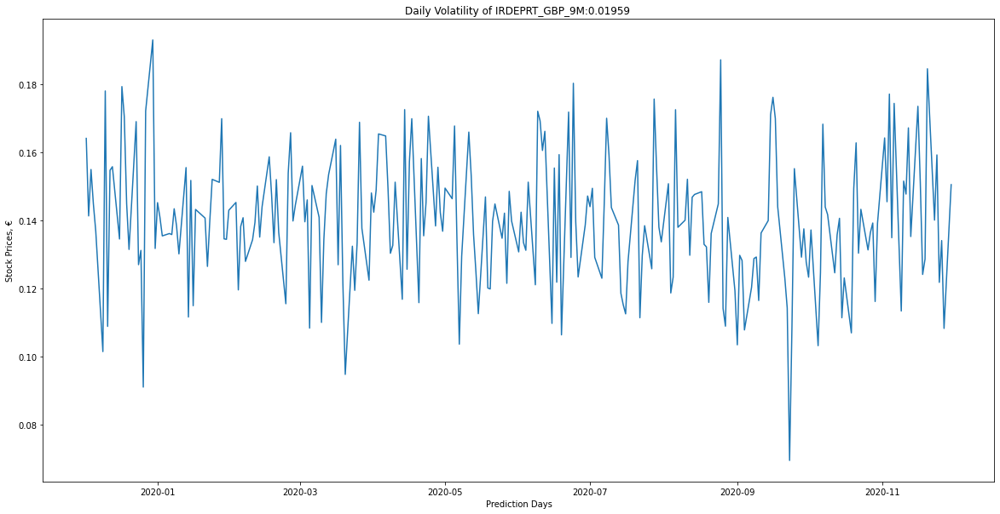

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_9M
Name: INSTRUMENT_IDENTIFIER, dtype: object


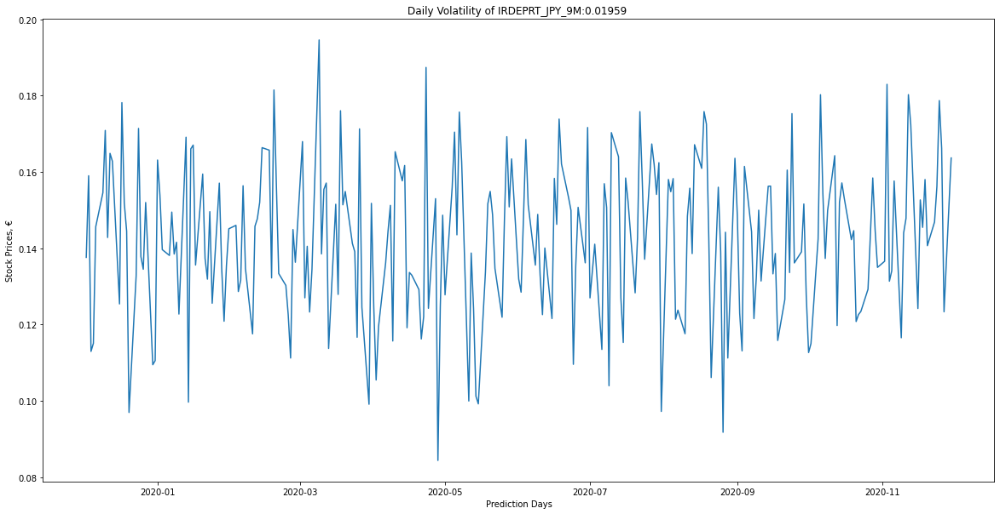

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_9M
Name: INSTRUMENT_IDENTIFIER, dtype: object


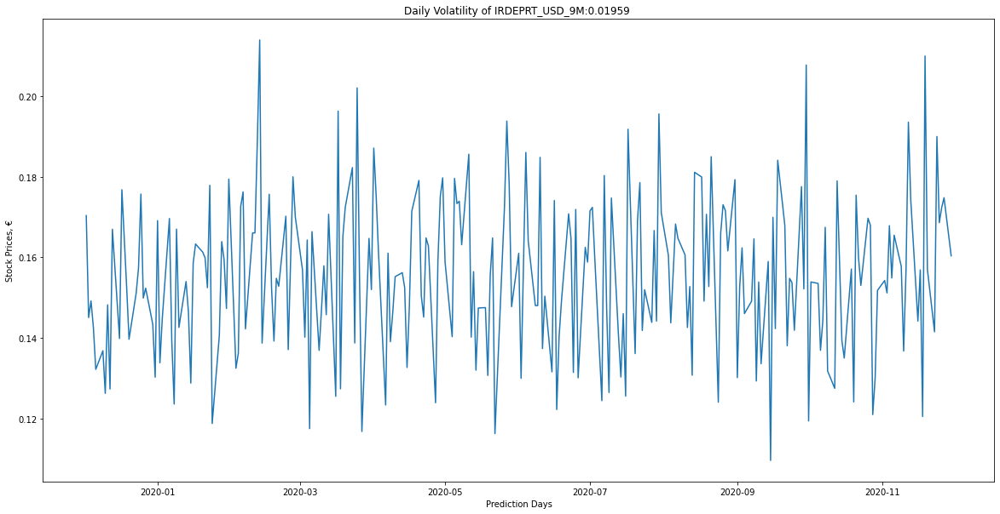

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_10M
Name: INSTRUMENT_IDENTIFIER, dtype: object


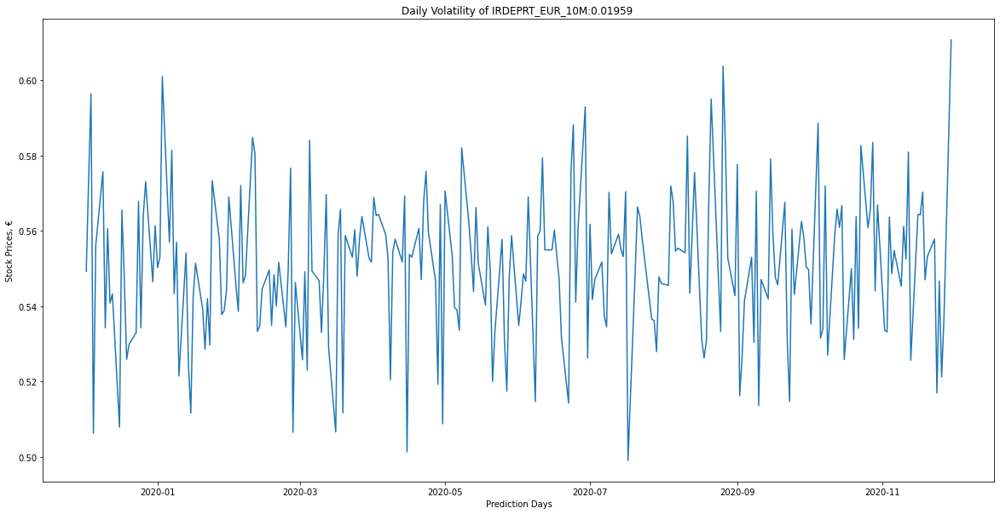

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_10M
Name: INSTRUMENT_IDENTIFIER, dtype: object


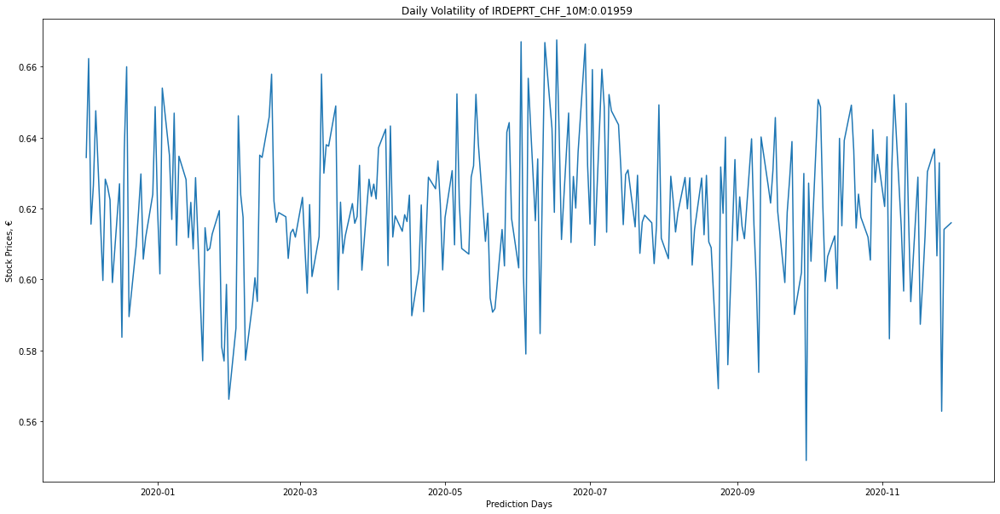

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_10M
Name: INSTRUMENT_IDENTIFIER, dtype: object


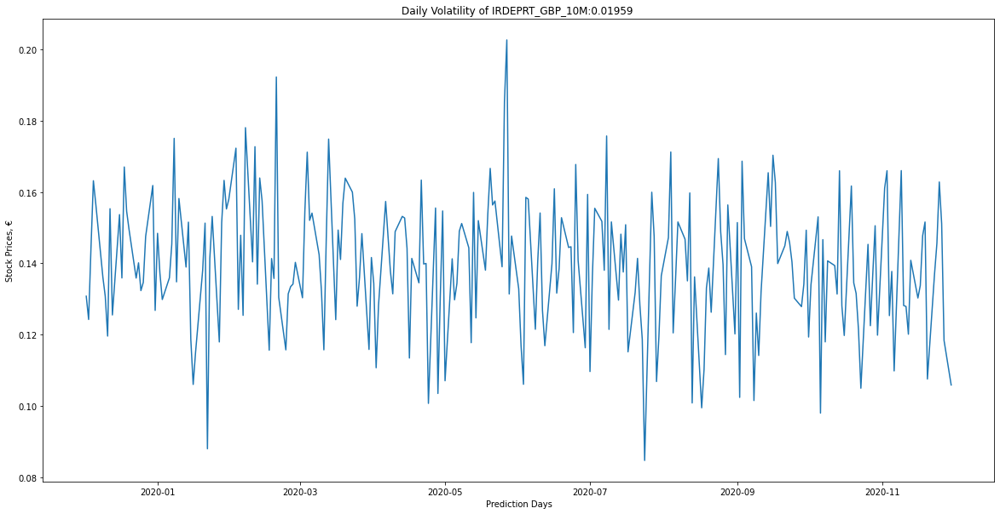

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_10M
Name: INSTRUMENT_IDENTIFIER, dtype: object


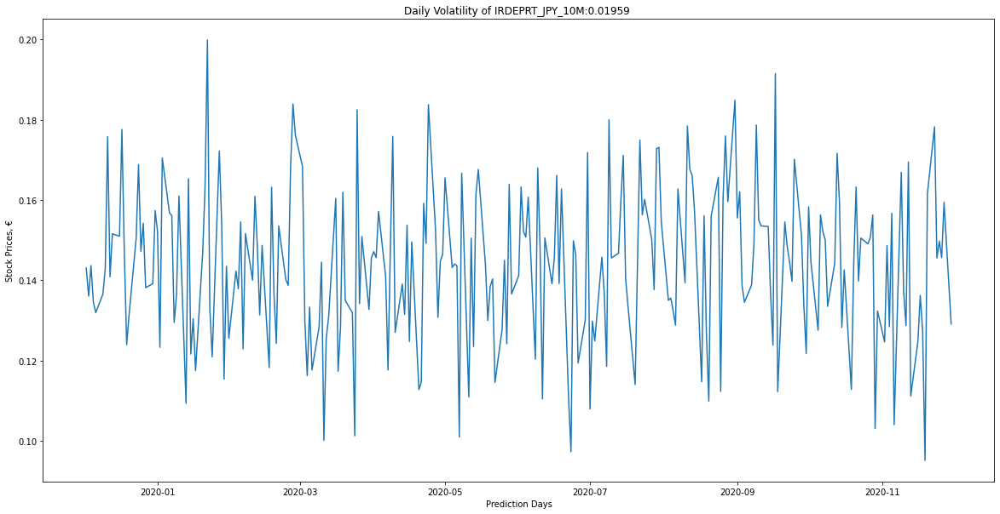

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_10M
Name: INSTRUMENT_IDENTIFIER, dtype: object


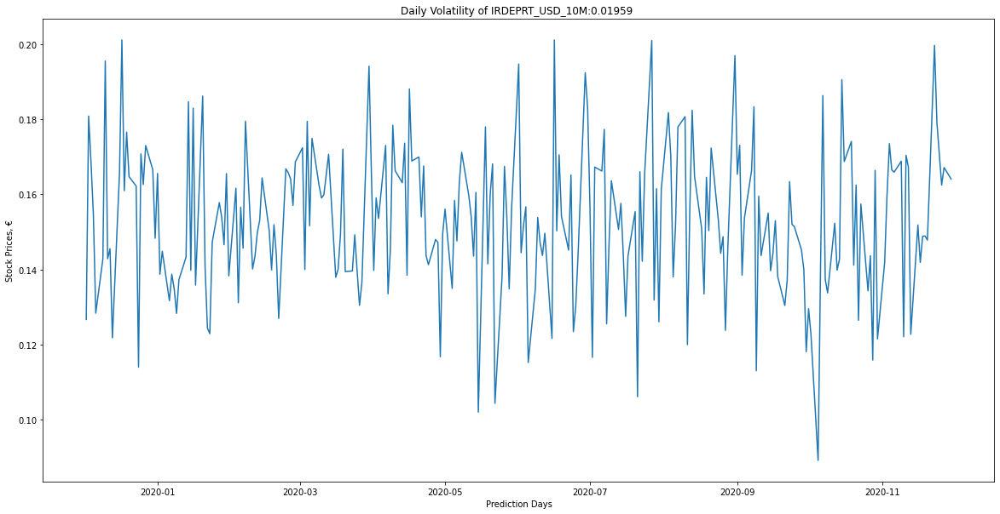

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_11M
Name: INSTRUMENT_IDENTIFIER, dtype: object


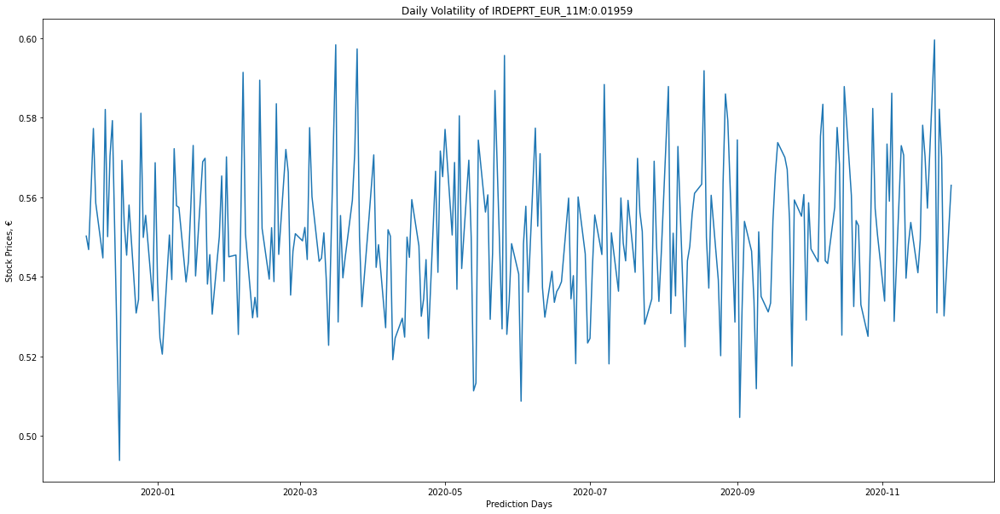

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_11M
Name: INSTRUMENT_IDENTIFIER, dtype: object


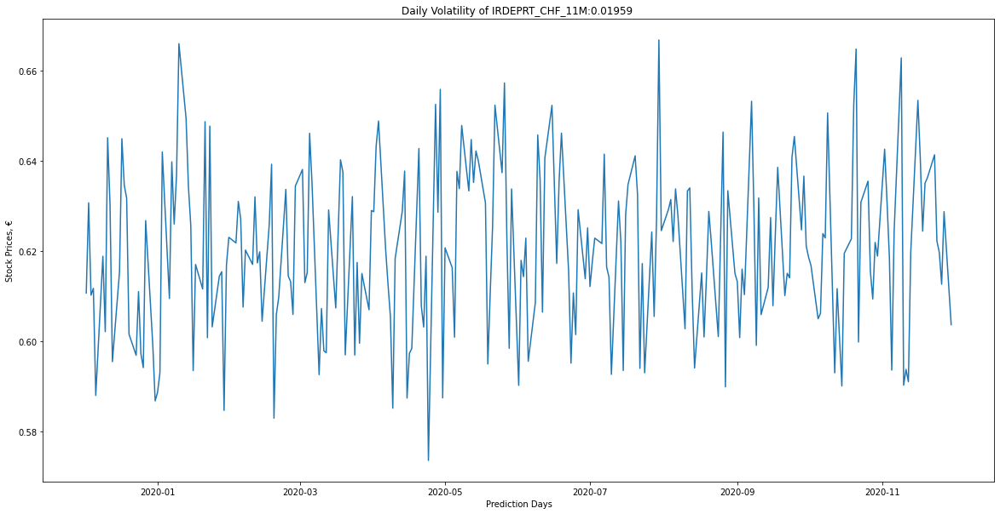

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_11M
Name: INSTRUMENT_IDENTIFIER, dtype: object


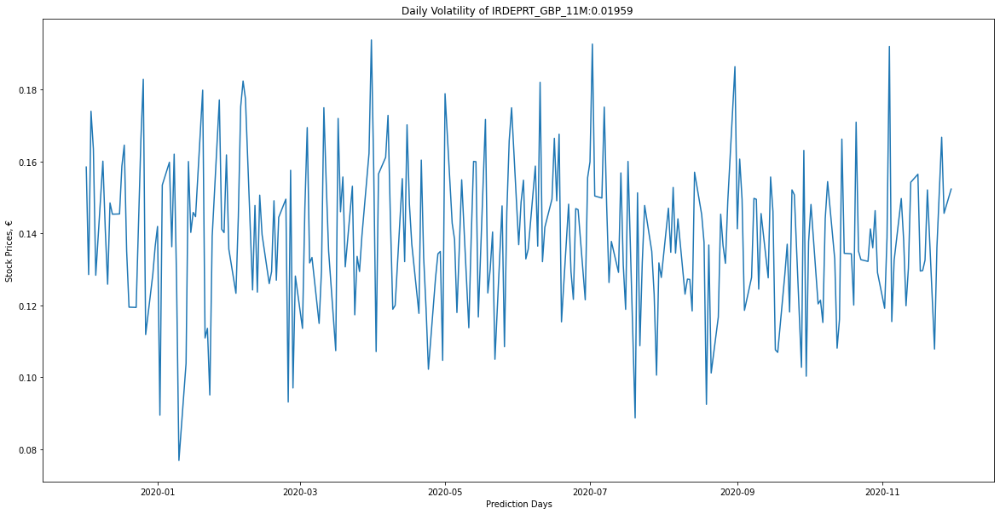

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_11M
Name: INSTRUMENT_IDENTIFIER, dtype: object


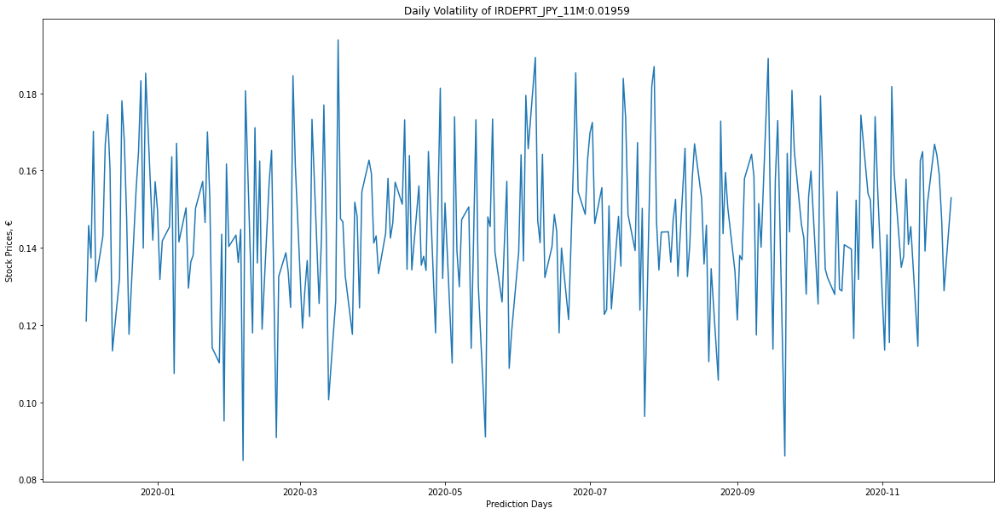

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_11M
Name: INSTRUMENT_IDENTIFIER, dtype: object


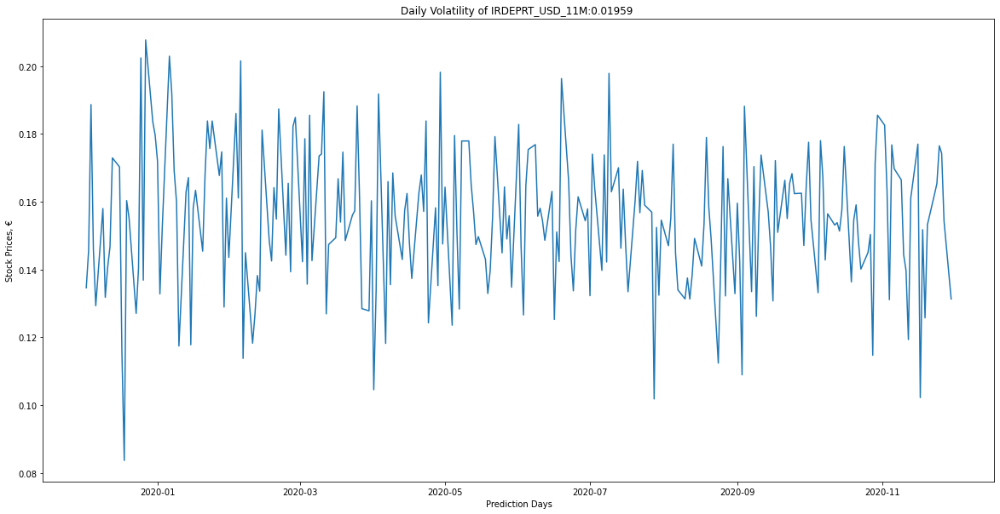

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0    IRDEPRT_EUR_1Y
Name: INSTRUMENT_IDENTIFIER, dtype: object


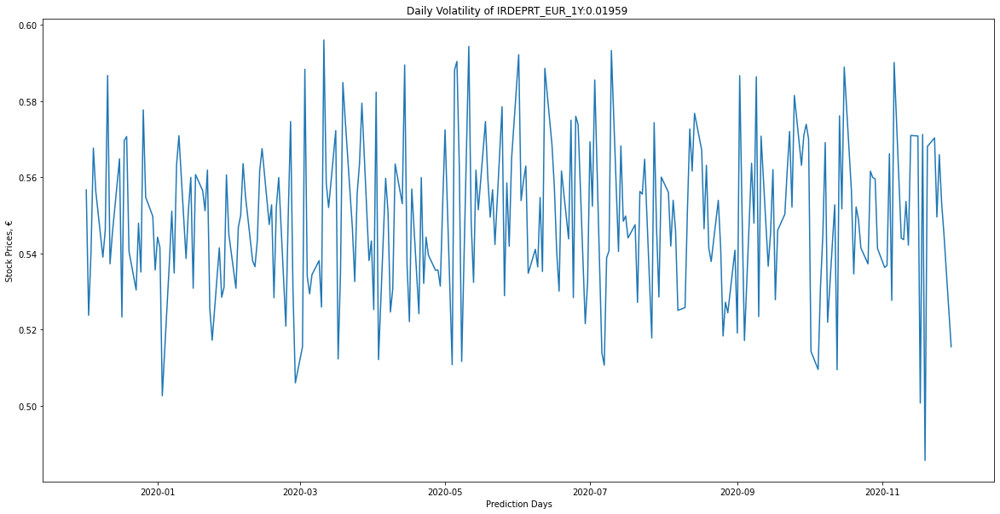

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1    IRDEPRT_CHF_1Y
Name: INSTRUMENT_IDENTIFIER, dtype: object


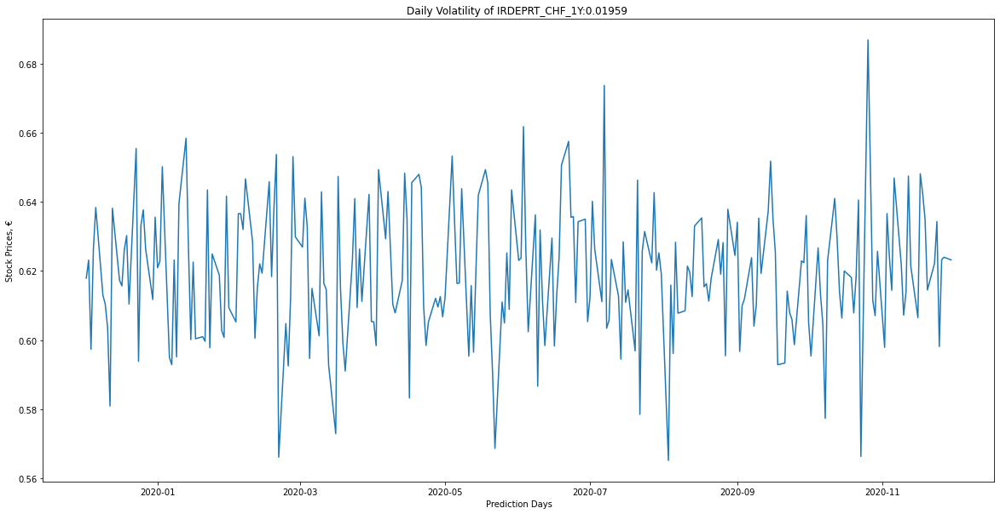

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2    IRDEPRT_GBP_1Y
Name: INSTRUMENT_IDENTIFIER, dtype: object


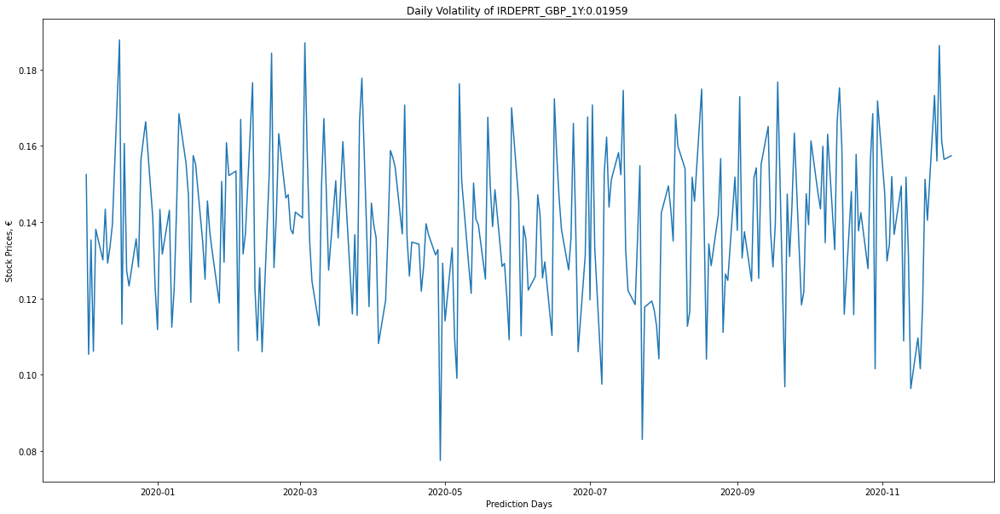

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


3    IRDEPRT_JPY_1Y
Name: INSTRUMENT_IDENTIFIER, dtype: object


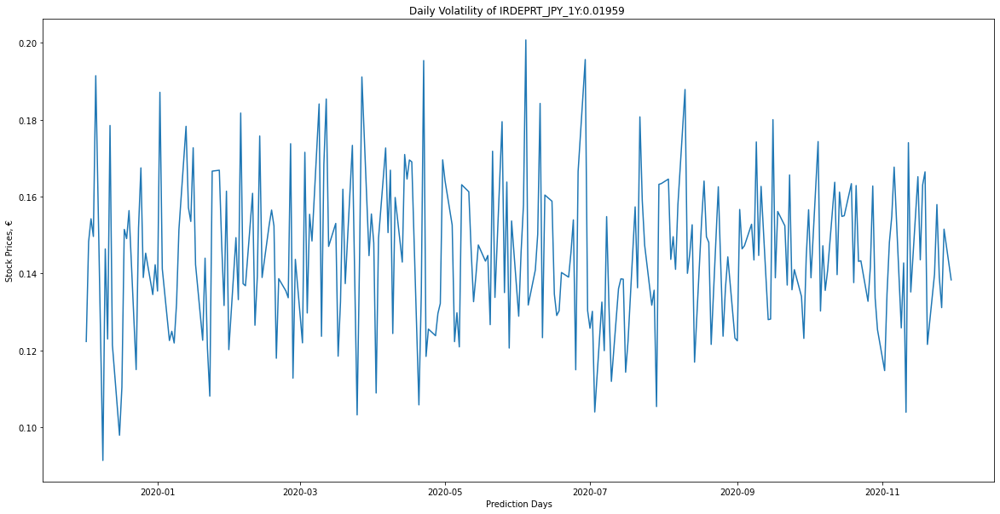

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


4    IRDEPRT_USD_1Y
Name: INSTRUMENT_IDENTIFIER, dtype: object


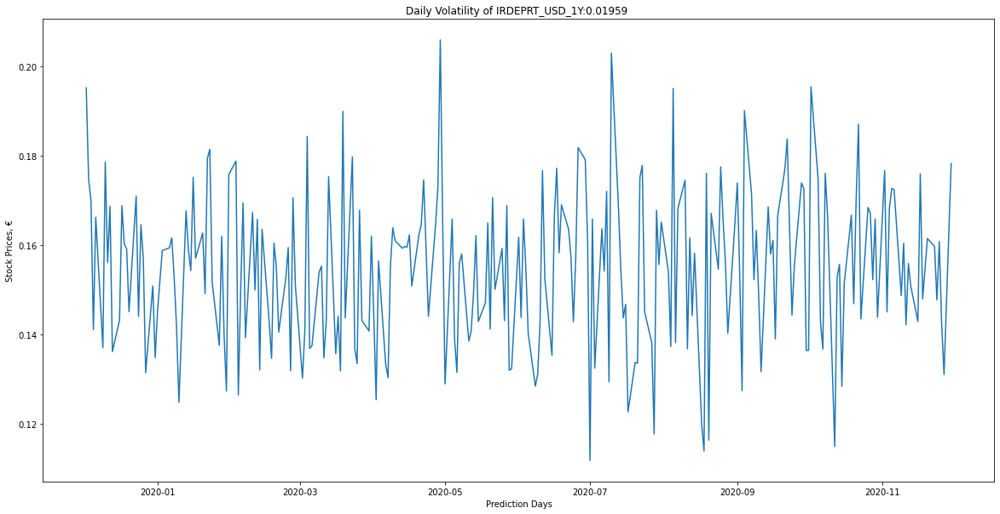

<Figure size 1440x720 with 0 Axes>

In [308]:
import pandas as pd
import statistics

# asset_types=['EQSHR','FXSPOT','FXFIX','IRFIX','FXVOL']
asset_types=['IRDEPRT']
for assettype in asset_types:
  print(assettype)
  df_seed=df=pd.read_excel("/content/AssetWiseSeedData.xlsx",assettype)
  print(df_seed)

  if assettype=='EQSHR':
    simulate_gbm(df_seed,assettype,False,"2019-11-30","2020-11-30")
  elif assettype=='FXFIX':
    simulate_spot_multiply_constant(df_seed,assettype,False,"2019-11-30","2020-11-30",0.0999)  
  elif assettype=='FXSPOT':
    simulate_gbm(df_seed,assettype,False,"2010-11-30","2020-11-30") 
  elif assettype=='IRDEPRT':
    tenorsIR=['ON','SN','TN','1W','2W','3W','1M','2M','3M','4M','5M','6M','7M','8M','9M','10M','11M','1Y']
    merged=pd.DataFrame()
    for tenor in tenorsIR:
      df_list=simulate_irdep(df_seed,assettype,False,"2019-11-30","2020-11-30",np.random.lognormal(),tenor,merged) 
      merged = merged.append(df_list)
    merged = merged.iloc[: , :]
    merged.drop(merged[pd.to_datetime(merged['PRICE_DATE_YYYYMMDD']).dt.weekday>5].index, inplace = True)

    merged[1:].to_csv("/content/"+assettype+".csv",index=False)  
  # # elif assettype=='FXVOL':
  # #   simulate_fxvol(df_seed,assettype)   
  elif assettype=='IRFIX':
    simulate_irfixing(df_seed,assettype) 
  # elif assettype=='BOND':
  #   simulate_bond(df_seed,assettype) 
  # # else:
  # #   print("Support to be added later")  